- Projeto sobre a análise dos dados de testes rápido de COVID-19, com o uso de machine learning.
- Esté o código do grupo LIFE-DATA, do Instituto D'vinci3, dados disponibilizados pelo Instituto Butantan.
- Alguns testes foram feitos de maneira "manual", porém, após uma discussão, optamos por uma função, para agilizar a análise da equipe de cientistas de dados do Instituto Butantan para se ter um melhor entendimentoo do tema.
- O código passou por algumas modificações desde a apresentação do dia 12/01/2022, trazendo novos resultados e novas interpretações tendo fim como aprimoramento do resultado.
- É necessário rodar todos os passos na ordem apresentada.

# Import

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import scikitplot as skplt

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from numpy import argmax

# Dataset

In [203]:
df = pd.read_csv(r"C:\Users\erick\OneDrive\Documentos\GitHub\IDV3---Data-Life\data_set_butanta.csv", sep=',')
df.head()


,result_igm,age_category,sex,conjunctivitis.x,asymptomatic.x,abdomen_pain.x,chills.x,diarrhea.x,missing_smell.x,missing_tasty.x,...,missing_smell.y,missing_tasty.y,nausea.y,body_pain.y,cough.y,fever.y,hard_breathe.y,head_pain.y,running_nose.y,throat_pain.y
0,0,5,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,2,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,5,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,6,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0


In [205]:
df.columns

Index(['result_igm', 'age_category', 'sex', 'conjunctivitis.x',
       'asymptomatic.x', 'abdomen_pain.x', 'chills.x', 'diarrhea.x',
       'missing_smell.x', 'missing_tasty.x', 'nausea.x', 'body_pain.x',
       'cough.x', 'fever.x', 'hard_breathe.x', 'head_pain.x', 'running_nose.x',
       'throat_pain.x', 'conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
       'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
       'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
       'head_pain.y', 'running_nose.y', 'throat_pain.y'],
      dtype='object')

In [206]:
df1 = pd.read_csv(r"C:\Users\erick\OneDrive\Documentos\GitHub\IDV3---Data-Life\data_set_butanta.csv", sep=',')
df1.head()


,result_igm,age_category,sex,conjunctivitis.x,asymptomatic.x,abdomen_pain.x,chills.x,diarrhea.x,missing_smell.x,missing_tasty.x,...,missing_smell.y,missing_tasty.y,nausea.y,body_pain.y,cough.y,fever.y,hard_breathe.y,head_pain.y,running_nose.y,throat_pain.y
0,0,5,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,2,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,5,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,6,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0


In [207]:
df1.drop('result_igm', axis=1, inplace=True)

In [208]:
df.drop(['conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
        'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
        'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
        'head_pain.y', 'running_nose.y', 'throat_pain.y'], axis=1, inplace=True)

In [209]:
df.columns

Index(['result_igm', 'age_category', 'sex', 'conjunctivitis.x',
       'asymptomatic.x', 'abdomen_pain.x', 'chills.x', 'diarrhea.x',
       'missing_smell.x', 'missing_tasty.x', 'nausea.x', 'body_pain.x',
       'cough.x', 'fever.x', 'hard_breathe.x', 'head_pain.x', 'running_nose.x',
       'throat_pain.x'],
      dtype='object')

In [210]:
df1.drop(['conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
        'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
        'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
        'head_pain.y', 'running_nose.y', 'throat_pain.y'], axis=1, inplace=True)

In [211]:
df1.columns

Index(['age_category', 'sex', 'conjunctivitis.x', 'asymptomatic.x',
       'abdomen_pain.x', 'chills.x', 'diarrhea.x', 'missing_smell.x',
       'missing_tasty.x', 'nausea.x', 'body_pain.x', 'cough.x', 'fever.x',
       'hard_breathe.x', 'head_pain.x', 'running_nose.x', 'throat_pain.x'],
      dtype='object')

In [212]:
df['result_igm'].value_counts()

0    1120640
1      71657
Name: result_igm, dtype: int64

# Scaler e definição de variáveis

In [213]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(df1)

In [214]:
X = scaled_X

In [12]:
X

array([[ 0.23978292,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [-1.59855278,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.23978292, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       ...,
       [-0.98577422, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.23978292,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.85256148, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665]])

In [13]:
y = df['result_igm']

# Random Forest (Manual)

In [14]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
print(f"Estatísticas do target y: {Counter(y_train)}")
print(f"Estatísticas do target X: {Counter(y_test)}")

Estatísticas do target y: Counter({0: 784451, 1: 50156})
Estatísticas do target X: Counter({0: 336189, 1: 21501})


In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [16]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750831, 1: 48007}))

In [17]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [18]:
y_pred = rfc.predict(X_test)

In [19]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369809
           1       0.17      0.01      0.01     23650

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [20]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [21]:
print(confusion_matrix(y_test, y_pred))

[[368996    813]
 [ 23478    172]]


In [22]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9382629448049224


In [23]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.01396387253907043


In [24]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.94031183 0.05968817]
 [0.94362864 0.05637136]
 [0.94928608 0.05071392]
 ...
 [0.95937987 0.04062013]
 [0.95937987 0.04062013]
 [0.94362864 0.05637136]]


In [25]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [26]:
roc_auc0 = auc(fpr0, tpr0)

In [27]:
thresholds

array([1.98000000e+00, 9.80000000e-01, 9.70000000e-01, ...,
       1.03092784e-04, 9.09090909e-05, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [28]:
J = tpr0 - fpr0
print(J)



[ 0.00000000e+00  3.68751009e-05  7.64543004e-05 ... -8.98412235e-04
 -9.03820432e-04  0.00000000e+00]


In [29]:
ix = argmax(J)
print(ix)

6533


In [30]:
cm1 = (confusion_matrix(y_test, y_pred))

In [31]:
cm1

array([[368996,    813],
       [ 23478,    172]], dtype=int64)

In [32]:
cm1[0,0]


368996

In [33]:
cm1[1,1]

172

In [34]:
cm1[0,1]

813

In [35]:
cm1[1,0]

23478

In [36]:
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

In [37]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.05968817]
 [0.         0.05637136]
 [0.         0.05071392]
 ...
 [0.         0.04062013]
 [0.         0.04062013]
 [0.         0.05637136]]


# Resultado Random Forest

In [38]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369809
           1       0.17      0.01      0.01     23650

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[368996    813]
 [ 23478    172]]
A acurácia do modelo: 0.9382629448049224
Valor do F1-score: 0.01396387253907043
Valor da sensibilidade: 0.007272727272727273
Valor da especificação: 0.9978015678363696


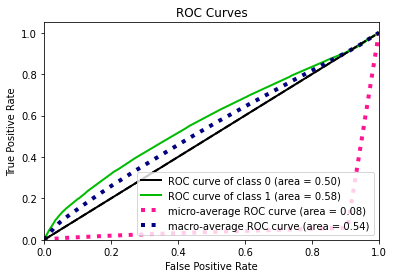

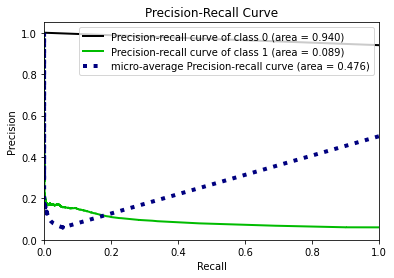

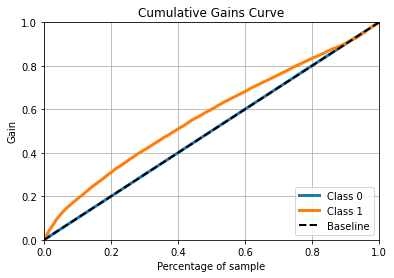

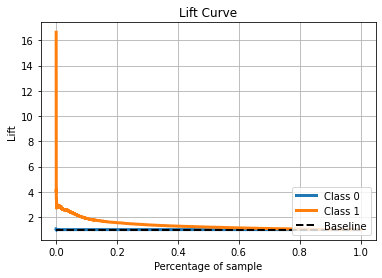

In [39]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

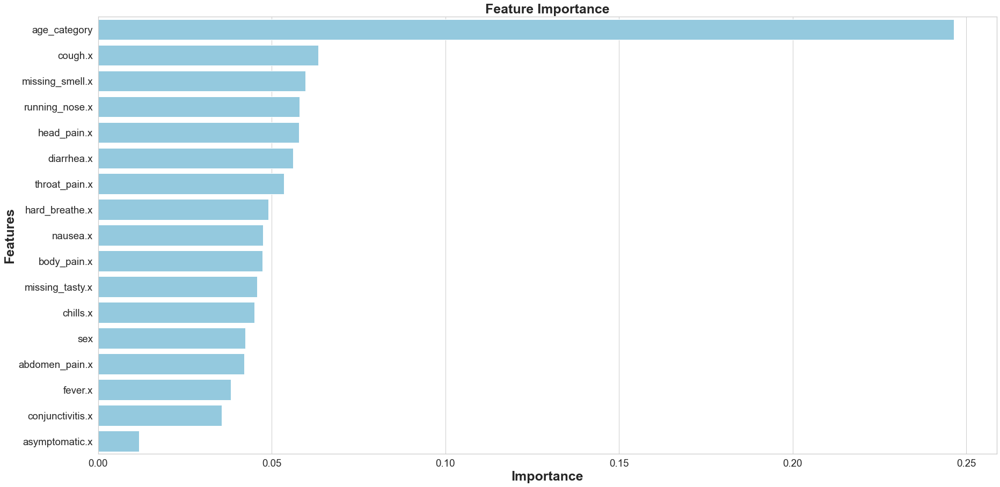

None

,Features,Gini-Importance
0,age_category,0.246397
1,cough.x,0.063432
2,missing_smell.x,0.059668
3,running_nose.x,0.058025
4,head_pain.x,0.057832
5,diarrhea.x,0.056107
6,throat_pain.x,0.053561
7,hard_breathe.x,0.049058
8,nausea.x,0.047484
9,body_pain.x,0.047372


In [40]:
feats = {}
for feature, importance in zip(df1.columns, rfc.feature_importances_):
    feats[feature] = importance
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index()
importances = importances.rename(columns={'index': 'Features'})
sns.set(font_scale = 5)
sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
fig, ax = plt.subplots()
fig.set_size_inches(30,15)
sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
plt.xlabel('Importance', fontsize=25, weight = 'bold')
plt.ylabel('Features', fontsize=25, weight = 'bold')
plt.title('Feature Importance', fontsize=25, weight = 'bold')
display(plt.show())
display(importances)

# Random Forest (Manual)
- (Random Over Sampler)

In [41]:
pip install imblearn

In [42]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(sampling_strategy = 'minority', random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)

In [43]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_res, y_res)

RandomForestClassifier(criterion='entropy')

In [44]:
y_pred = rfc.predict(X_test)

In [45]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.74      0.83    369809
           1       0.08      0.36      0.14     23650

    accuracy                           0.72    393459
   macro avg       0.52      0.55      0.48    393459
weighted avg       0.90      0.72      0.79    393459



In [46]:
print(confusion_matrix(y_test, y_pred))

[[274559  95250]
 [ 15022   8628]]


In [47]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.7197369992807383


In [48]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.13531146101248354


In [49]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.50226925 0.49773075]
 [0.51729736 0.48270264]
 [0.54404769 0.45595231]
 ...
 [0.60262868 0.39737132]
 [0.60262868 0.39737132]
 [0.51729736 0.48270264]]


In [50]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [51]:
roc_auc0 = auc(fpr0, tpr0)

In [52]:
thresholds

array([2.00000000e+00, 1.00000000e+00, 9.82118066e-01, ...,
       7.69230769e-04, 3.50877193e-04, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [53]:
J = tpr0 - fpr0
print(J)

[ 0.          0.00247778  0.00264692 ... -0.00112895 -0.00113436
  0.        ]


In [54]:
ix = argmax(J)
print(ix)

4044


In [55]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.49773075]
 [0.         0.48270264]
 [0.         0.45595231]
 ...
 [0.         0.39737132]
 [0.         0.39737132]
 [0.         0.48270264]]


In [56]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750831, 1: 750831})
Testing target statistics: Counter({0: 369809, 1: 23650})


In [57]:
#roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

In [58]:
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

# Resultado Random Forest 
- (Random OverSample)

In [59]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)

A matriz de classificação:               precision    recall  f1-score   support

           0       0.95      0.74      0.83    369809
           1       0.08      0.36      0.14     23650

    accuracy                           0.72    393459
   macro avg       0.52      0.55      0.48    393459
weighted avg       0.90      0.72      0.79    393459

A matriz de confusão: [[274559  95250]
 [ 15022   8628]]
A acurácia do modelo: 0.7197369992807383
Valor do F1-score: 0.13531146101248354
Valor da sensibilidade: 0.007272727272727273
Valor da especificação: 0.9978015678363696


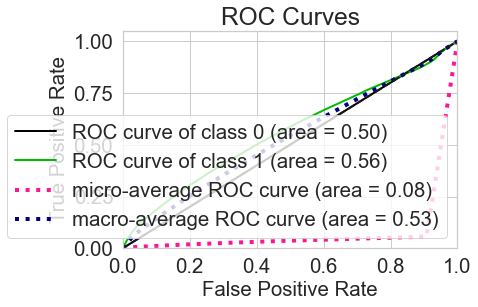

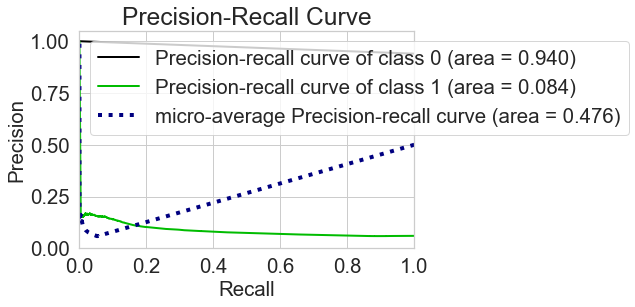

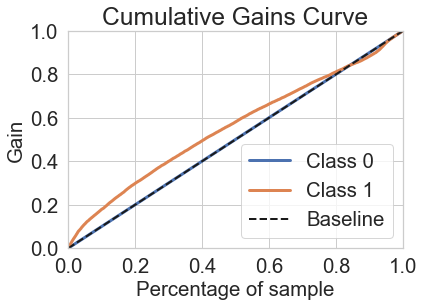

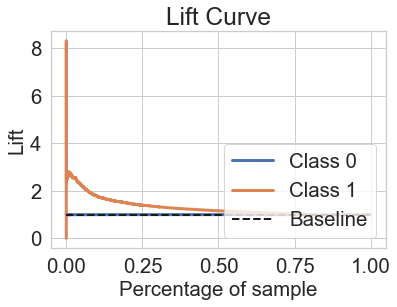

In [60]:
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Random Forest (Manual)
- Smote

In [61]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=100)
print(f"Estatistica de treinamento do target X: {Counter(y_train)}")
print(f"Estatistica de treinamento do target y: {Counter(y_test)}")

Estatistica de treinamento do target X: Counter({1: 525904, 0: 525259})
Estatistica de treinamento do target y: Counter({0: 225572, 1: 224927})


In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [64]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [65]:
y_pred = rfc.predict(X_test)

In [66]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369556
           1       0.17      0.01      0.01     23903

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [67]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [68]:
print(confusion_matrix(y_test, y_pred))

[[368743    813]
 [ 23732    171]]


In [69]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9376173883428769


In [70]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.013742114356893155


In [71]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.94421525 0.05578475]
 [0.96132383 0.03867617]
 [0.97228889 0.02771111]
 ...
 [1.         0.        ]
 [0.96132383 0.03867617]
 [0.95488203 0.04511797]]


In [72]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [73]:
roc_auc0 = auc(fpr0, tpr0)

In [74]:
thresholds

array([1.99400000e+00, 9.94000000e-01, 9.70984848e-01, ...,
       1.00000000e-04, 3.92156863e-05, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [75]:
J = tpr0 - fpr0
print(J)



[ 0.00000000e+00 -2.70594984e-06 -8.11784953e-06 ... -1.54778463e-03
 -1.55590248e-03  0.00000000e+00]


In [76]:
ix = argmax(J)
print(ix)

6565


In [77]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.05578475]
 [0.         0.03867617]
 [0.         0.02771111]
 ...
 [0.         0.        ]
 [0.         0.03867617]
 [0.         0.04511797]]


# Resultado Random Forest
 - Smote

In [78]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369556
           1       0.17      0.01      0.01     23903

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[368743    813]
 [ 23732    171]]
A acurácia do modelo: 0.9376173883428769
Valor do F1-score: 0.013742114356893155
Valor da sensibilidade: 0.007272727272727273
Valor da especificação: 0.9978015678363696


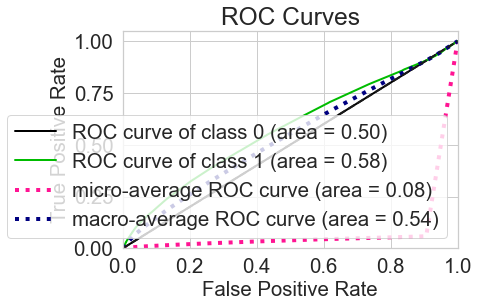

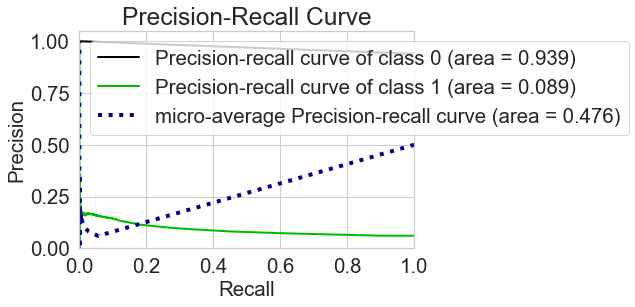

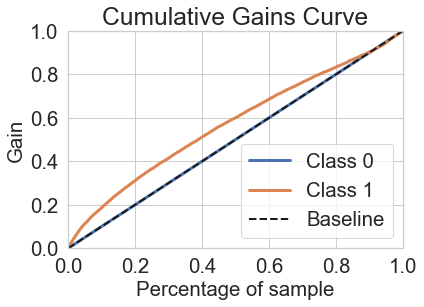

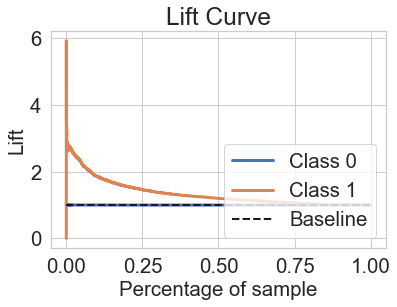

In [79]:
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# PCA

In [80]:
from sklearn.decomposition import PCA

In [81]:
pca = PCA(n_components=15)
pca_df = pca.fit_transform(scaled_X)
variancia = round(sum(pca.explained_variance_ratio_), 2)

In [82]:
y = df.result_igm
type(y)

pandas.core.series.Series

In [83]:
pca_df[:,:9].shape

(1192297, 9)

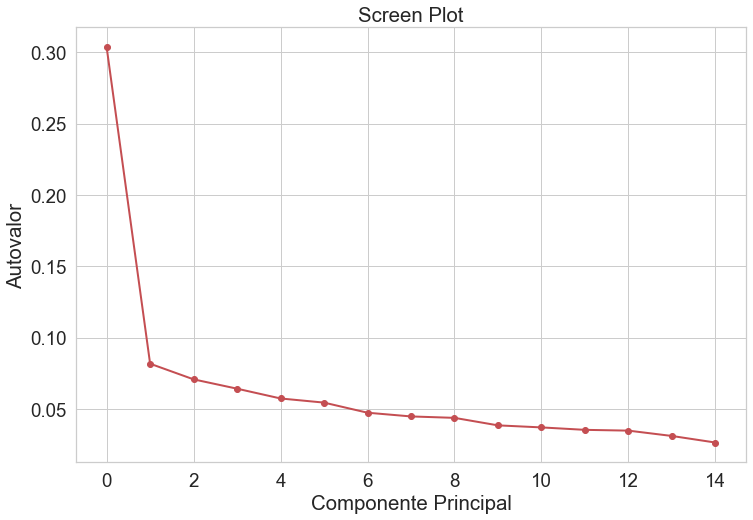

In [84]:
import numpy as np
fig = plt.figure(figsize=(12,8))

plt.plot(pca.explained_variance_ratio_,  'ro-', linewidth=2)
plt.title('Screen Plot')
plt.xlabel('Componente Principal')
plt.ylabel('Autovalor')

plt.show()

# Random Forest DEF ✅

In [85]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

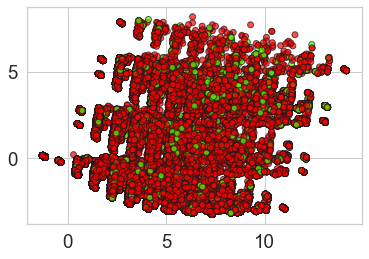

Resultado da prescisão 0.17034700315457413
Resultado do recall 0.006777391959168305
Resultado F1 0.013036131005069607
Resultado acurácia 0.9376555117559898
Sensibilidade:  0.006777391959168305
Especificação:  0.9978650055742567


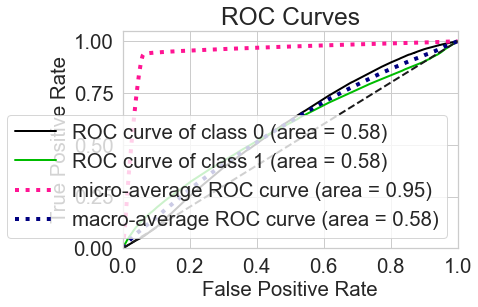

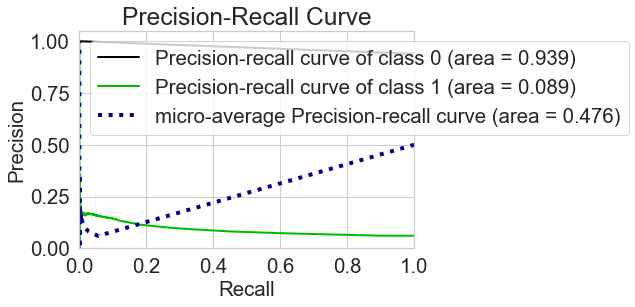

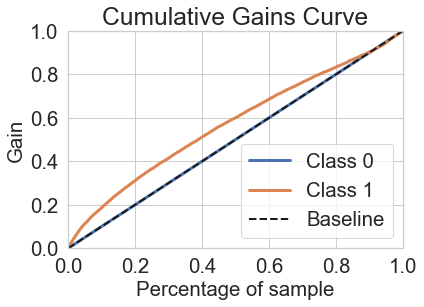

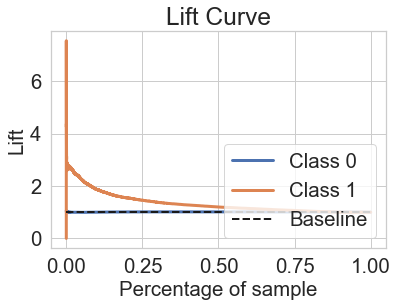

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369556
           1       0.17      0.01      0.01     23903

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

[[368767    789]
 [ 23741    162]]


In [86]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- Oversample

In [87]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 751084, 1: 751084})
Testing target statistics: Counter({0: 369556, 1: 23903})


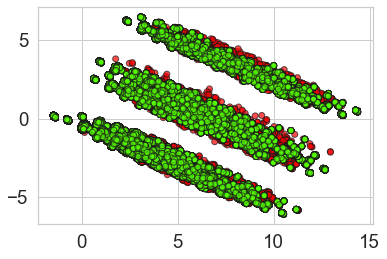

Resultado da prescisão 0.08454019905834674
Resultado do recall 0.35606409237334224
Resultado F1 0.13663838429244562
Resultado acurácia 0.7266424201759268
Sensibilidade:  0.35606409237334224
Especificação:  0.750611544664408


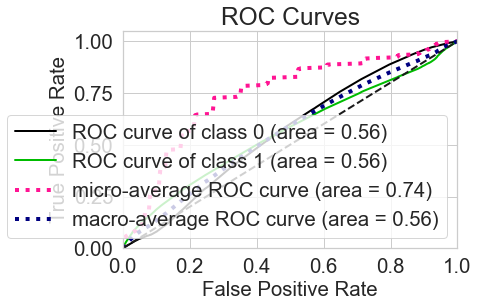

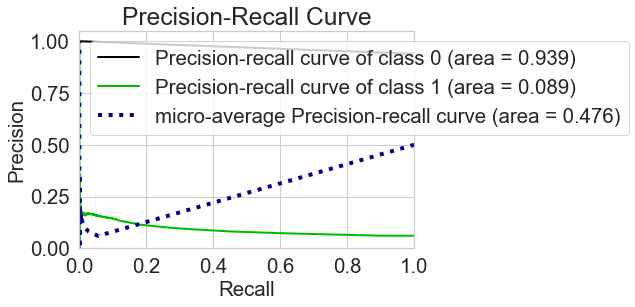

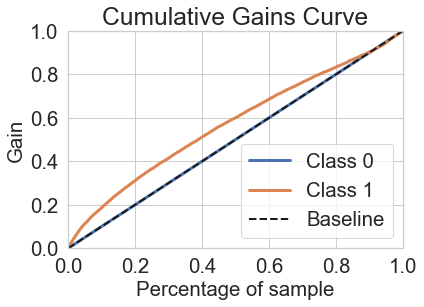

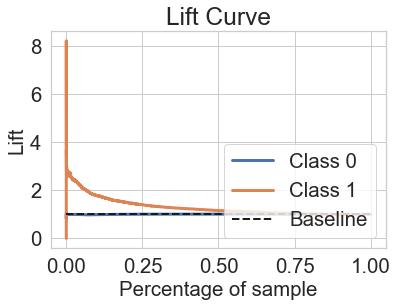

              precision    recall  f1-score   support

           0       0.95      0.75      0.84    369556
           1       0.08      0.36      0.14     23903

    accuracy                           0.73    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.73      0.80    393459

[[277393  92163]
 [ 15392   8511]]


In [88]:
roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

- SMOTE

In [89]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 751084, 1: 751084})
Testing target statistics: Counter({0: 369556, 1: 23903})


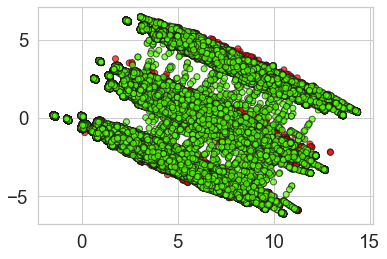

Resultado da prescisão 0.07759788048277892
Resultado do recall 0.3859766556499184
Resultado F1 0.12921749604336194
Resultado acurácia 0.683967071537314
Sensibilidade:  0.3859766556499184
Especificação:  0.7032411867213629


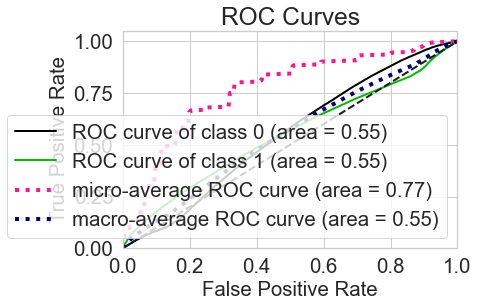

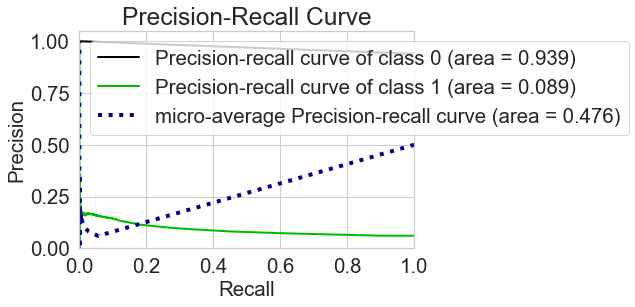

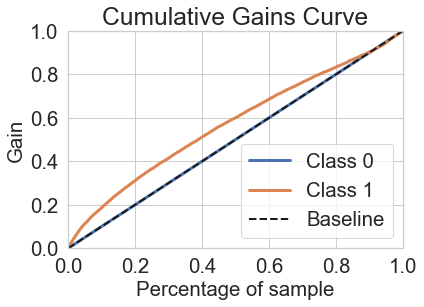

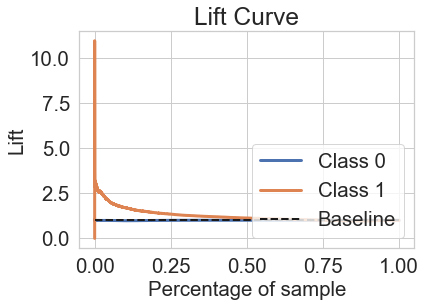

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369556
           1       0.08      0.39      0.13     23903

    accuracy                           0.68    393459
   macro avg       0.51      0.54      0.47    393459
weighted avg       0.89      0.68      0.77    393459

[[259887 109669]
 [ 14677   9226]]


In [90]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- UnderSampler

In [91]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47754, 1: 47754})
Testing target statistics: Counter({0: 369556, 1: 23903})


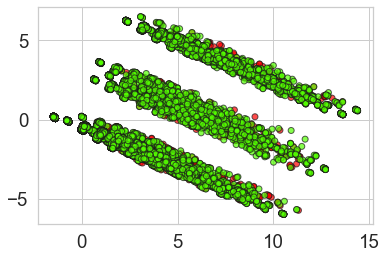

Resultado da prescisão 0.08549205556942018
Resultado do recall 0.42994603187884367
Resultado F1 0.1426241907392116
Resultado acurácia 0.6859672799453056
Sensibilidade:  0.42994603187884367
Especificação:  0.7025268159629393


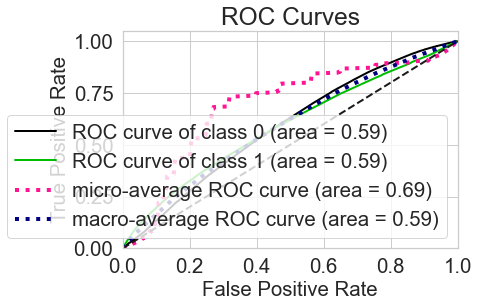

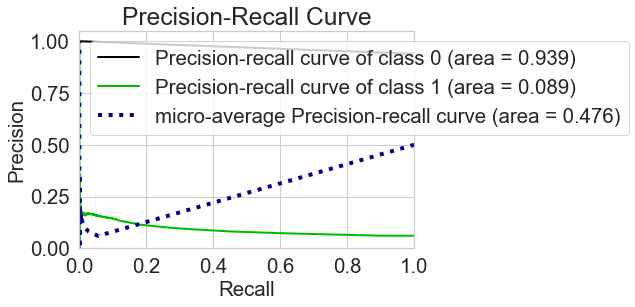

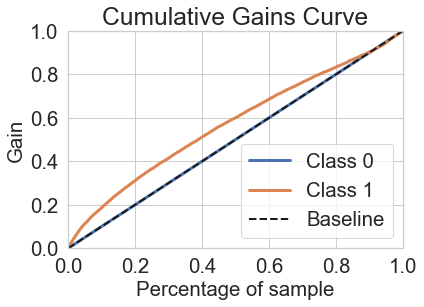

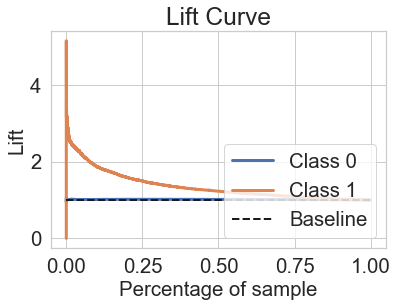

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369556
           1       0.09      0.43      0.14     23903

    accuracy                           0.69    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.69      0.77    393459

[[259623 109933]
 [ 13626  10277]]


In [92]:
roc_auc_rus1,fpr_rus1,tpr_rus1 , _ = build_and_test(X_res, X_test, y_res, y_test)

- NearMiss

In [93]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47754, 1: 47754})
Testing target statistics: Counter({0: 369556, 1: 23903})


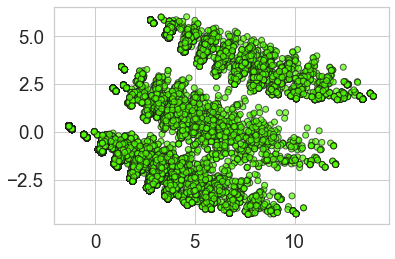

Resultado da prescisão 0.06453513848385488
Resultado do recall 0.5360415010668117
Resultado F1 0.11520099260045134
Resultado acurácia 0.49976998874088535
Sensibilidade:  0.5360415010668117
Especificação:  0.49742393574992694


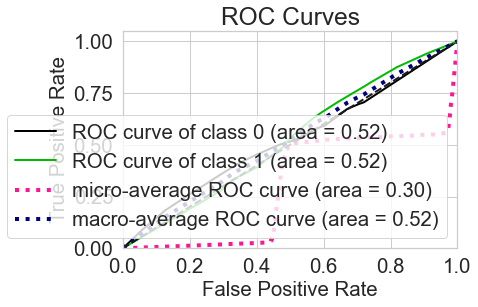

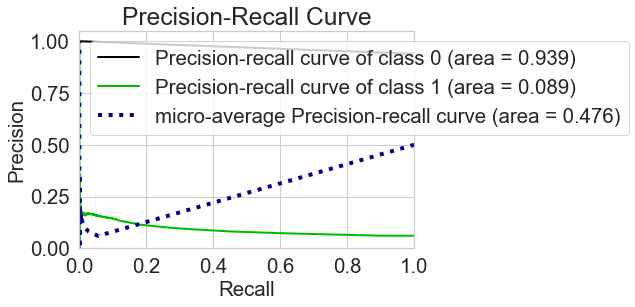

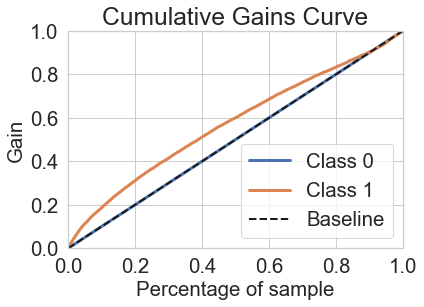

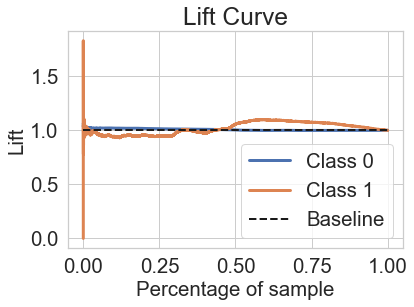

              precision    recall  f1-score   support

           0       0.94      0.50      0.65    369556
           1       0.06      0.54      0.12     23903

    accuracy                           0.50    393459
   macro avg       0.50      0.52      0.38    393459
weighted avg       0.89      0.50      0.62    393459

[[183826 185730]
 [ 11090  12813]]


In [94]:
roc_auc_nm1,fpr_nm1,tpr_nm1, _  = build_and_test(X_res, X_test, y_res, y_test)

- CW

In [95]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 751084, 1: 47754}))

In [96]:
n[0]

751084

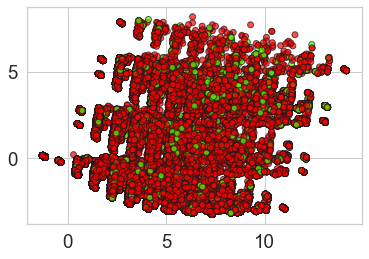

Resultado da prescisão 0.09109946229295576
Resultado do recall 0.28209848136217214
Resultado F1 0.13772326671500495
Resultado acurácia 0.7854033075873217
Sensibilidade:  0.28209848136217214
Especificação:  0.8179572243448895


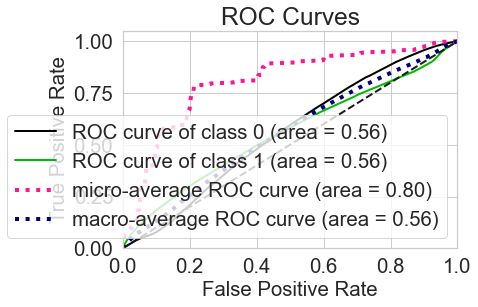

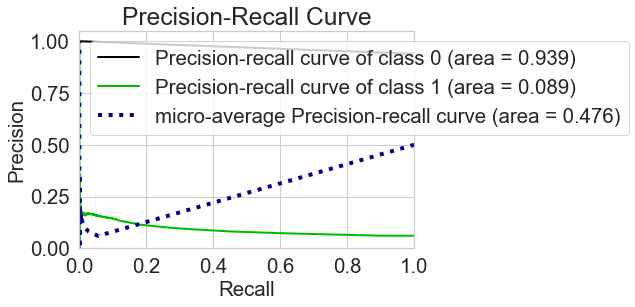

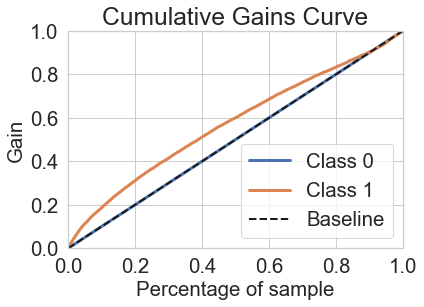

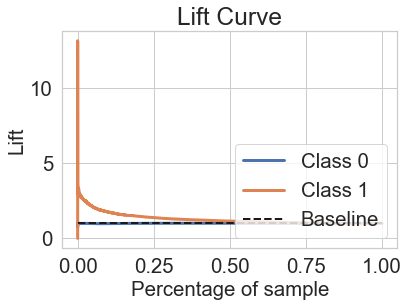

              precision    recall  f1-score   support

           0       0.95      0.82      0.88    369556
           1       0.09      0.28      0.14     23903

    accuracy                           0.79    393459
   macro avg       0.52      0.55      0.51    393459
weighted avg       0.89      0.79      0.83    393459

[[302281  67275]
 [ 17160   6743]]


In [97]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

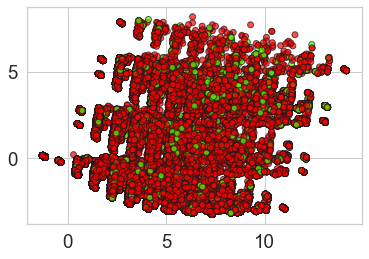

Resultado da prescisão 0.16037735849056603
Resultado do recall 0.006400870183658955
Resultado F1 0.012310415577101018
Resultado acurácia 0.9376021389776317
Sensibilidade:  0.006400870183658955
Especificação:  0.9978325341761465


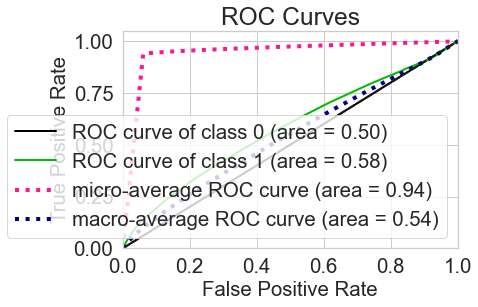

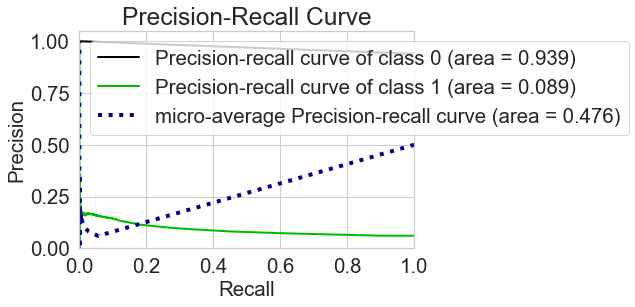

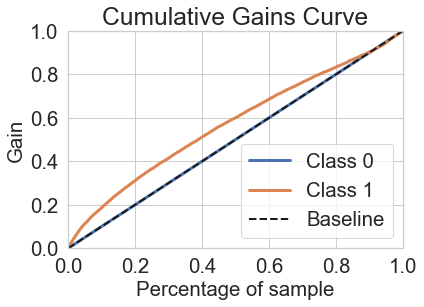

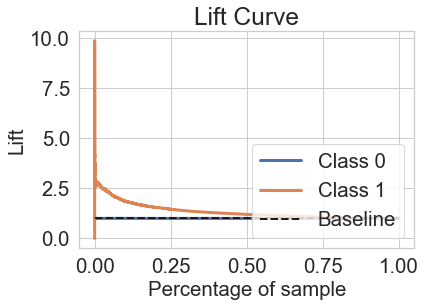

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369556
           1       0.16      0.01      0.01     23903

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

[[368755    801]
 [ 23750    153]]
Best Treshold: 0.05971428571428571


In [98]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

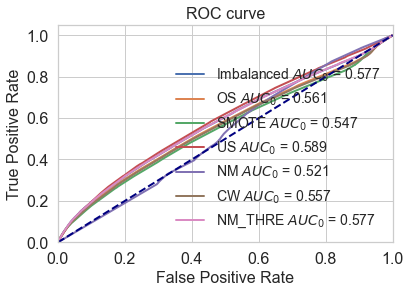

In [99]:
plt.plot(fpr_imb, tpr_imb, lw=2, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros, tpr_ros, lw=2, label='OS $AUC_0$ = %.3f' % (roc_auc_ros))
plt.plot(fpr_smote, tpr_smote, lw=2, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus1, tpr_rus1, lw=2, label='US $AUC_0$ = %.3f' % (roc_auc_rus1))
plt.plot(fpr_nm1, tpr_nm1, lw=2, label='NM $AUC_0$ = %.3f' % (roc_auc_nm1))
plt.plot(fpr_cw, tpr_cw, lw=2, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=2, label='NM_THRE $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# Regressão Logistíca (Manual)

In [100]:
from sklearn.linear_model import LogisticRegression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
print(f"Estatísticas do target y: {Counter(y_train)}")
print(f"Estatísticas do target X: {Counter(y_test)}")

Estatísticas do target y: Counter({0: 784451, 1: 50156})
Estatísticas do target X: Counter({0: 336189, 1: 21501})


- Vectorizer, pois é Logit ???? (ValueError: Cannot center sparse matrices: pass `with_mean=False` instead. See docstring for motivation and alternatives.)

In [101]:
#vectorizer = TfidfVectorizer(binary = True)
#matrix = vectorizer.fit_transform(df1)
#X = matrix


In [102]:
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [103]:
X = scaled_X

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [105]:
from sklearn.linear_model import LogisticRegression

In [106]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(sampling_strategy = 'minority', random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)


In [107]:
lgt = LogisticRegression()
lgt.fit(X_train, y_train)

LogisticRegression()

In [108]:
y_pred = lgt.predict(X_test)

In [109]:
print(classification_report(y_test, y_pred))

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369983
           1       0.00      0.00      0.00     23476

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459



C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [110]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [111]:
print(confusion_matrix(y_test, y_pred))

[[369983      0]
 [ 23476      0]]


In [112]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9403343169173917


In [113]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.0


In [114]:
y_score = lgt.predict_proba(X_test)
print(y_score)

[[0.95554134 0.04445866]
 [0.9266823  0.0733177 ]
 [0.93291573 0.06708427]
 ...
 [0.96095826 0.03904174]
 [0.96080947 0.03919053]
 [0.94233916 0.05766084]]


In [115]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [116]:
roc_auc0 = auc(fpr0, tpr0)

In [117]:
thresholds

array([1.39740101, 0.39740101, 0.39473128, ..., 0.01808299, 0.01722553,
       0.01622465])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [118]:
J = tpr0 - fpr0
print(J)



[ 0.00000000e+00 -2.70282689e-06 -5.40565377e-06 ...  1.08113075e-05
  5.40565377e-06  0.00000000e+00]


In [119]:
ix = argmax(J)
print(ix)

10774


In [120]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.04445866]
 [0.         0.0733177 ]
 [0.         0.06708427]
 ...
 [0.         0.03904174]
 [0.         0.03919053]
 [0.         0.05766084]]


# Resultado Regressão Logística

In [121]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )



C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369983
           1       0.00      0.00      0.00     23476

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

A matriz de confusão: [[369983      0]
 [ 23476      0]]
A acurácia do modelo: 0.9403343169173917
Valor do F1-score: 0.0


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


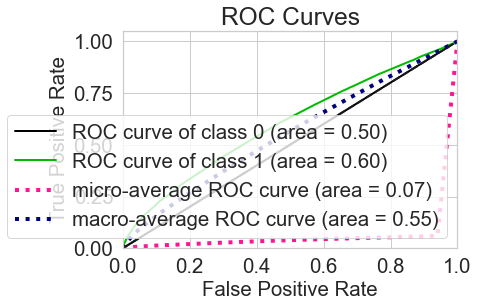

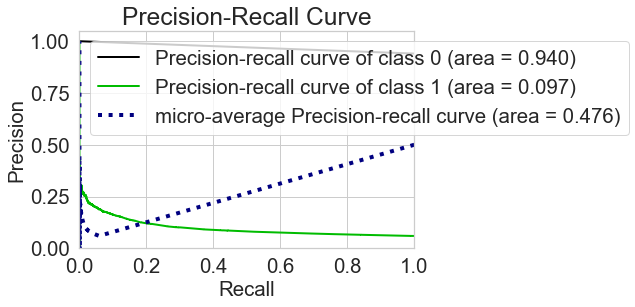

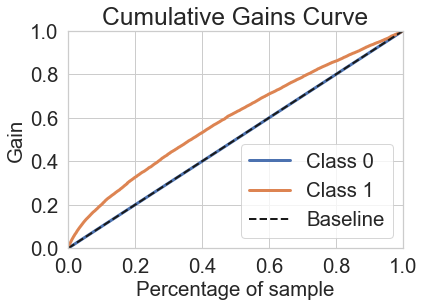

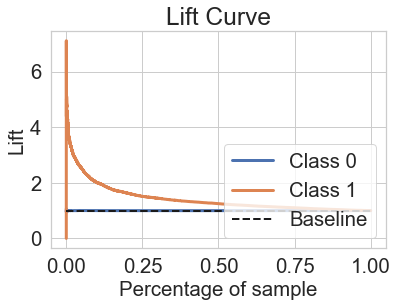

In [122]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Regressão Logística DEF ✅

In [123]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = LogisticRegression()
    else:
        model = LogisticRegression()
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

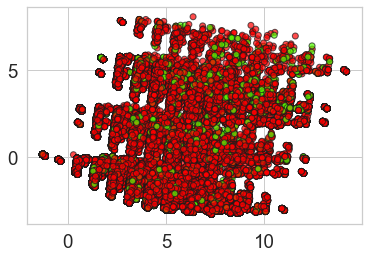

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9403343169173917
Sensibilidade:  0.0
Especificação:  1.0


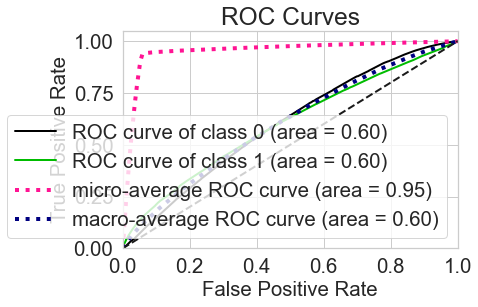

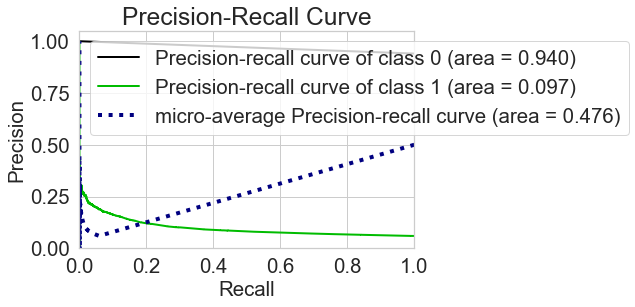

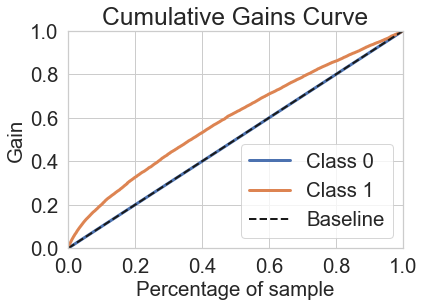

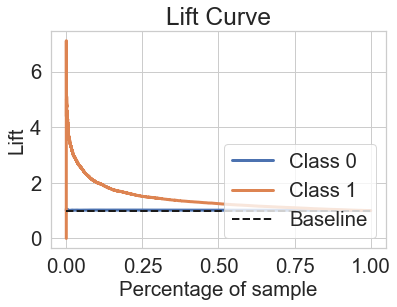

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369983
           1       0.00      0.00      0.00     23476

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369983      0]
 [ 23476      0]]


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [124]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- Oversample 🏆

In [125]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750657, 1: 750657})
Testing target statistics: Counter({0: 369983, 1: 23476})


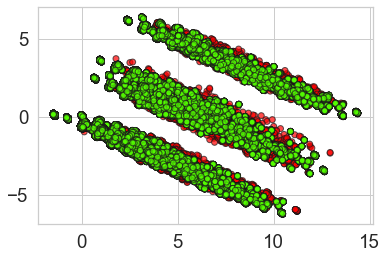

Resultado da prescisão 0.08554906647610129
Resultado do recall 0.44364457318112116
Resultado F1 0.1434385307707669
Resultado acurácia 0.6838577844197236
Sensibilidade:  0.44364457318112116
Especificação:  0.69909968836406


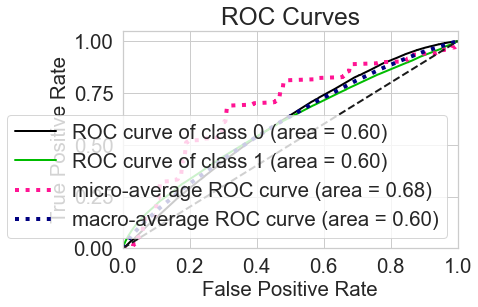

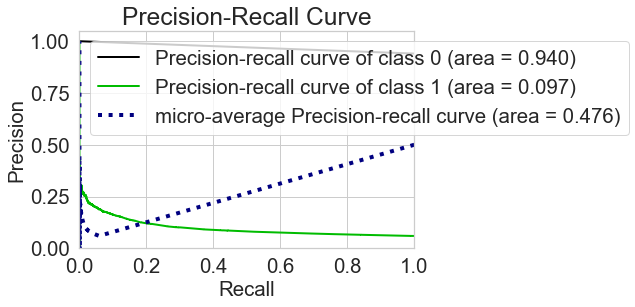

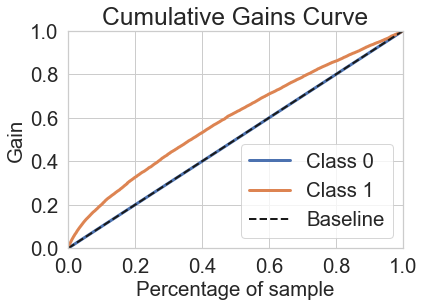

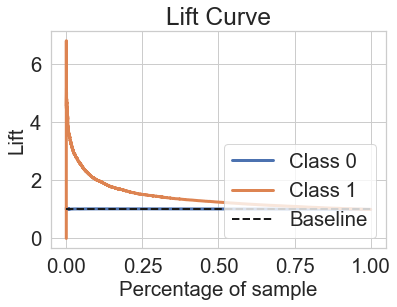

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369983
           1       0.09      0.44      0.14     23476

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.47    393459
weighted avg       0.90      0.68      0.77    393459

[[258655 111328]
 [ 13061  10415]]


In [126]:
roc_auc_ros2,fpr_ros2,tpr_ros2, _ = build_and_test(X_res, X_test, y_res, y_test)

- SMOTE

In [127]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750657, 1: 750657})
Testing target statistics: Counter({0: 369983, 1: 23476})


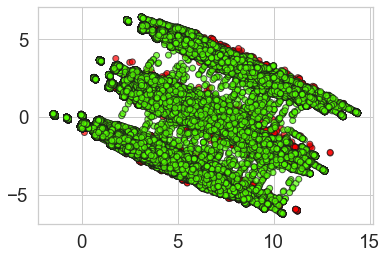

Resultado da prescisão 0.0855100267270074
Resultado do recall 0.44428352359856876
Resultado F1 0.14341698178068066
Resultado acurácia 0.6833469306840103
Sensibilidade:  0.44428352359856876
Especificação:  0.6985158777565456


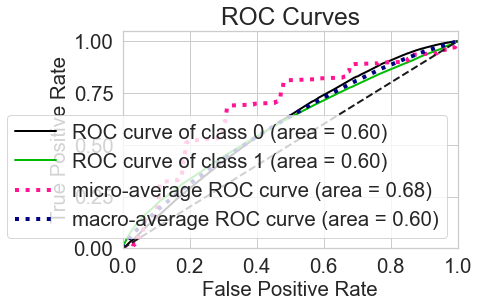

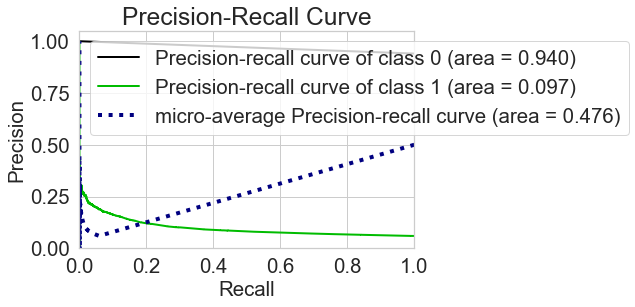

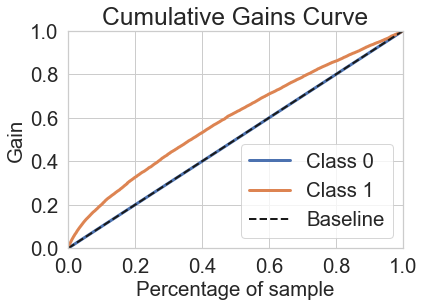

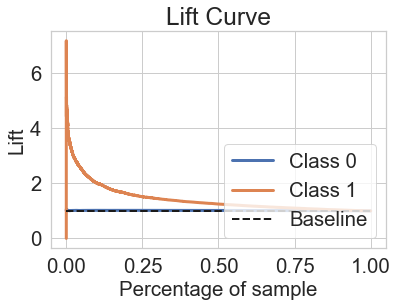

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369983
           1       0.09      0.44      0.14     23476

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.47    393459
weighted avg       0.90      0.68      0.77    393459

[[258439 111544]
 [ 13046  10430]]


In [128]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- UnderSampler

In [129]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48181, 1: 48181})
Testing target statistics: Counter({0: 369983, 1: 23476})


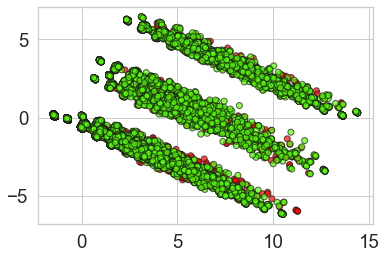

Resultado da prescisão 0.08530439730147119
Resultado do recall 0.44705230874084173
Resultado F1 0.14327058277476692
Resultado acurácia 0.6809934453145055
Sensibilidade:  0.44705230874084173
Especificação:  0.6958373763118846


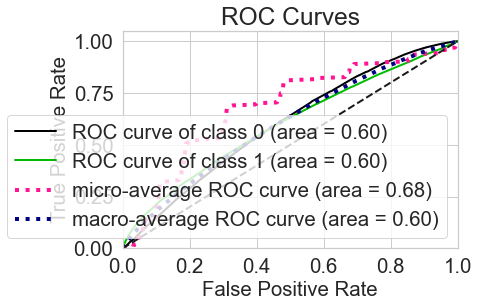

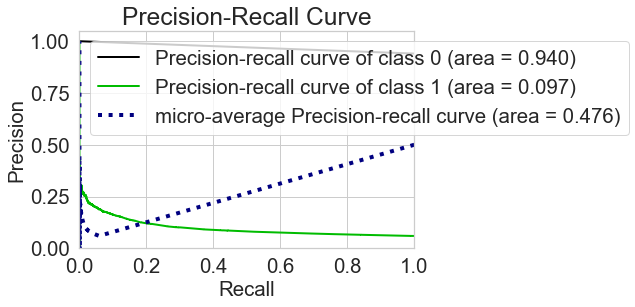

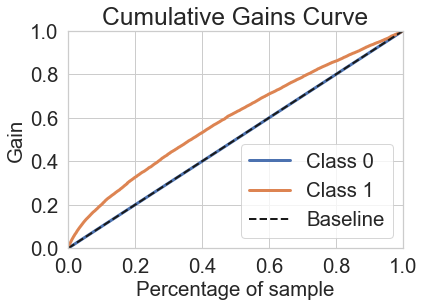

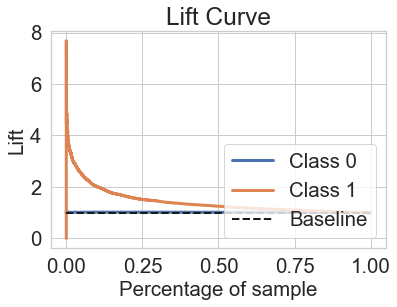

              precision    recall  f1-score   support

           0       0.95      0.70      0.80    369983
           1       0.09      0.45      0.14     23476

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.47    393459
weighted avg       0.90      0.68      0.76    393459

[[257448 112535]
 [ 12981  10495]]


In [130]:
roc_auc_rus,fpr_rus,tpr_rus , _ = build_and_test(X_res, X_test, y_res, y_test)

- NearMiss

In [131]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48181, 1: 48181})
Testing target statistics: Counter({0: 369983, 1: 23476})


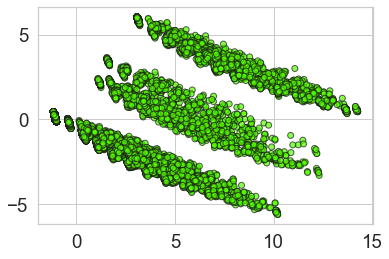

Resultado da prescisão 0.0798165137614679
Resultado do recall 0.3928267166467882
Resultado F1 0.13267537549634575
Resultado acurácia 0.6935589222765269
Sensibilidade:  0.3928267166467882
Especificação:  0.7126408510661301


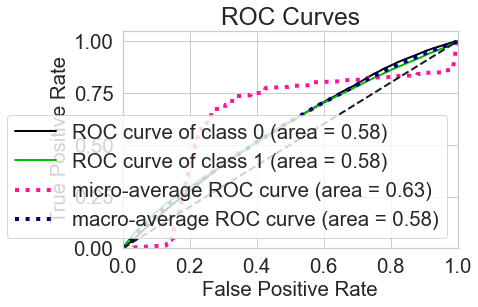

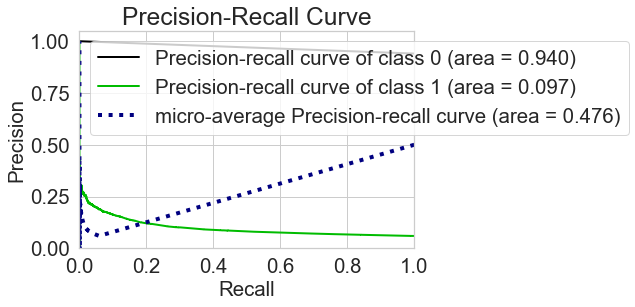

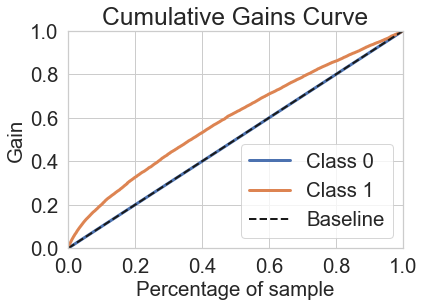

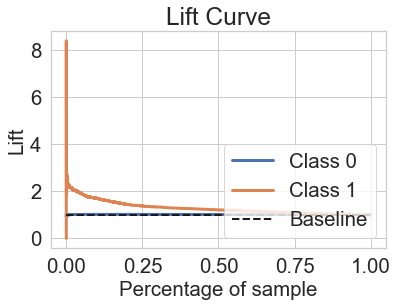

              precision    recall  f1-score   support

           0       0.95      0.71      0.81    369983
           1       0.08      0.39      0.13     23476

    accuracy                           0.69    393459
   macro avg       0.51      0.55      0.47    393459
weighted avg       0.90      0.69      0.77    393459

[[263665 106318]
 [ 14254   9222]]


In [132]:
roc_auc_nm,fpr_nm,tpr_nm, _  = build_and_test(X_res, X_test, y_res, y_test)

- Class Weight

In [133]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750657, 1: 48181}))

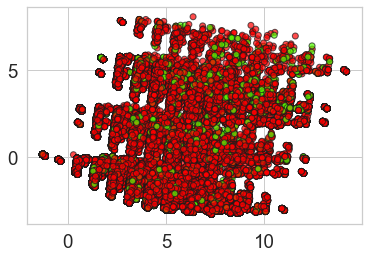

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9403343169173917
Sensibilidade:  0.0
Especificação:  1.0


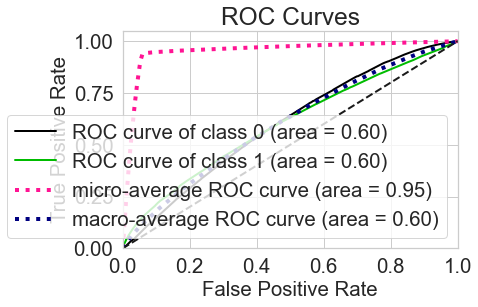

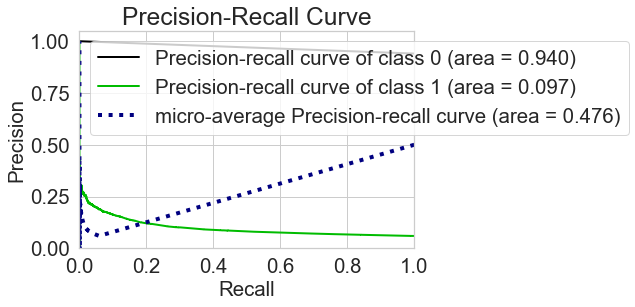

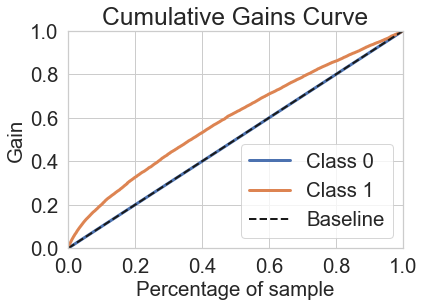

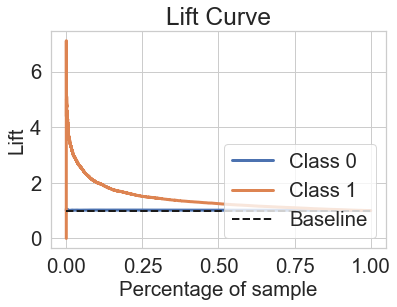

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369983
           1       0.00      0.00      0.00     23476

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369983      0]
 [ 23476      0]]


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [134]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

- Threshold

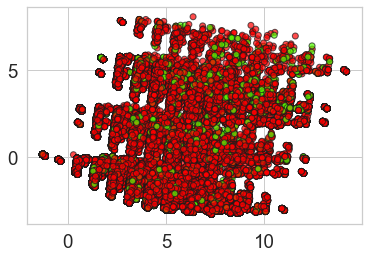

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9403343169173917
Sensibilidade:  0.0
Especificação:  1.0


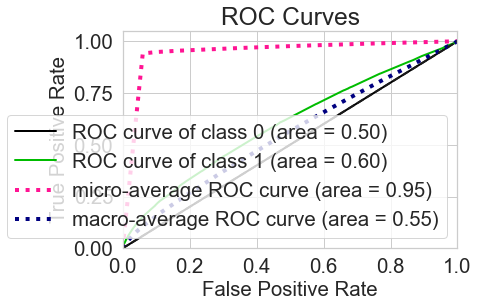

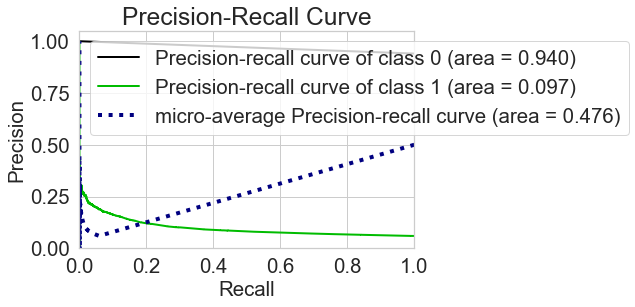

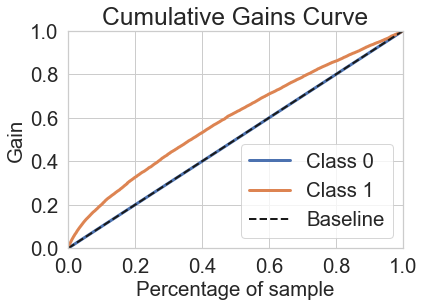

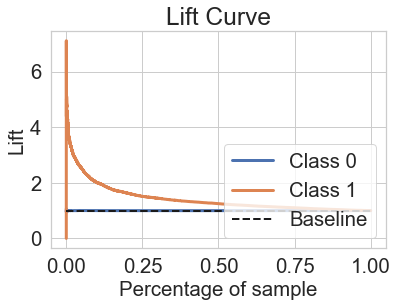

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369983
           1       0.00      0.00      0.00     23476

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369983      0]
 [ 23476      0]]
Best Treshold: 0.06094328866047884


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [135]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

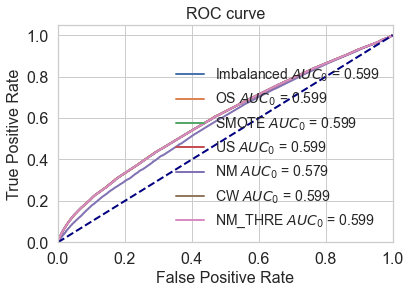

In [136]:
plt.plot(fpr_imb, tpr_imb, lw=2, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros2, tpr_ros2, lw=2, label='OS $AUC_0$ = %.3f' % (roc_auc_ros2))
plt.plot(fpr_smote, tpr_smote, lw=2, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus, tpr_rus, lw=2, label='US $AUC_0$ = %.3f' % (roc_auc_rus))
plt.plot(fpr_nm, tpr_nm, lw=2, label='NM $AUC_0$ = %.3f' % (roc_auc_nm))
plt.plot(fpr_cw, tpr_cw, lw=2, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=2, label='NM_THRE $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# Decision Tree (Manual)

In [137]:
from sklearn.tree import DecisionTreeClassifier

In [138]:
X = df1

In [139]:
y = df['result_igm']

In [140]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [141]:
X = scaled_X

In [142]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [143]:
from sklearn.tree import DecisionTreeClassifier
d_t = DecisionTreeClassifier()
d_t.fit(X_train, y_train)

DecisionTreeClassifier()

In [144]:
y_pred = d_t.predict(X_test)

In [145]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369964
           1       0.16      0.01      0.02     23495

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [146]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [147]:
print(confusion_matrix(y_test, y_pred))

[[368579   1385]
 [ 23224    271]]


In [148]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9374547284469283


In [149]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.021549838972605463


In [150]:
y_score = d_t.predict_proba(X_test)
print(y_score)

[[0.95915345 0.04084655]
 [0.96088746 0.03911254]
 [0.96088746 0.03911254]
 ...
 [0.96551724 0.03448276]
 [0.95087254 0.04912746]
 [0.95915345 0.04084655]]


In [151]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [152]:
roc_auc0 = auc(fpr0, tpr0)

In [153]:
thresholds

array([2.        , 1.        , 0.75      , 0.71428571, 0.66666667,
       0.625     , 0.6       , 0.57142857, 0.55555556, 0.53846154,
       0.5       , 0.46153846, 0.44444444, 0.42857143, 0.41666667,
       0.4       , 0.38888889, 0.38461538, 0.375     , 0.37037037,
       0.36363636, 0.35714286, 0.35294118, 0.34615385, 0.33333333,
       0.32258065, 0.31578947, 0.3125    , 0.30769231, 0.30434783,
       0.3       , 0.29411765, 0.28571429, 0.27777778, 0.27272727,
       0.27027027, 0.26923077, 0.26829268, 0.26666667, 0.26315789,
       0.26126126, 0.26086957, 0.25714286, 0.25      , 0.24285714,
       0.24242424, 0.23809524, 0.23529412, 0.23519164, 0.23333333,
       0.23076923, 0.22641509, 0.22580645, 0.225     , 0.22429907,
       0.22222222, 0.22033898, 0.21818182, 0.2173913 , 0.21428571,
       0.21212121, 0.21052632, 0.20833333, 0.20588235, 0.20454545,
       0.20408163, 0.20155039, 0.2       , 0.19444444, 0.19428571,
       0.19421488, 0.19354839, 0.19230769, 0.19101124, 0.19047

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [154]:
J = tpr0 - fpr0
print(J)



[ 0.          0.00608298  0.00634848  0.00638564  0.00744691  0.00748137
  0.00758945  0.0076901   0.00779346  0.00779076  0.01320908  0.01319826
  0.01340228  0.01370288  0.01380895  0.01515933  0.01529984  0.01576666
  0.0160443   0.01611051  0.01615238  0.01625776  0.01623884  0.01619559
  0.0194534   0.0195169   0.01947635  0.01951282  0.019477    0.0197398
  0.02031332  0.02044573  0.02188192  0.02191839  0.02253044  0.02262569
  0.0227554   0.02309993  0.02316545  0.02340933  0.02354375  0.02352753
  0.02358022  0.02727374  0.02753855  0.02752908  0.027929    0.02804584
  0.03003804  0.03005357  0.03100742  0.03117968  0.03119792  0.0312398
  0.03126477  0.03204563  0.03220167  0.0325266   0.03260156  0.03294606
  0.03290011  0.03291697  0.03302033  0.03307032  0.03319732  0.03317771
  0.03339928  0.0361862   0.03623618  0.03668     0.03709002  0.03717175
  0.03727443  0.03738453  0.0375777   0.03779793  0.0378695   0.03779652
  0.03780935  0.0379046   0.03838958  0.03864358  0.0

In [155]:
ix = argmax(J)
print(ix)

364


In [156]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.04084655]
 [0.         0.03911254]
 [0.         0.03911254]
 ...
 [0.         0.03448276]
 [0.         0.04912746]
 [0.         0.04084655]]


# Resultado Decision Tree 

In [157]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )



A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369964
           1       0.16      0.01      0.02     23495

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[368579   1385]
 [ 23224    271]]
A acurácia do modelo: 0.9374547284469283
Valor do F1-score: 0.021549838972605463


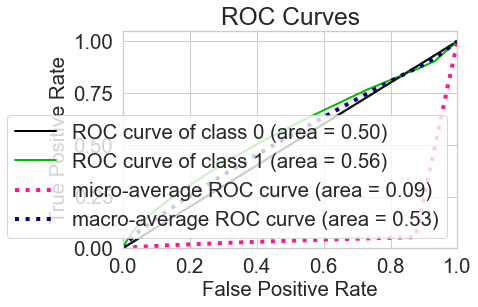

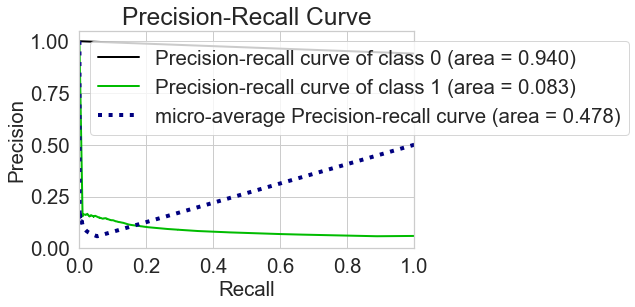

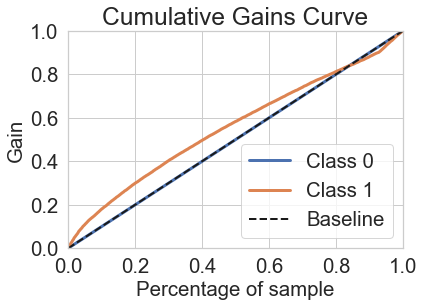

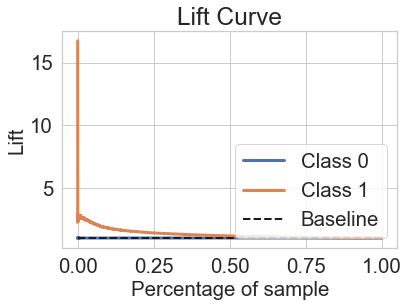

In [158]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Decision Tree DEF ✅

In [159]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report

from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # construindo modelo
    if class_weight:
        model = DecisionTreeClassifier(class_weight=class_weight)
    else:
        model = DecisionTreeClassifier()
    model.fit(X_tr, y_tr)
    
    # modelo
    y_pred = model.predict(X_te)
    print('Precision score %s' % precision_score(y_te, y_pred))
    print('Recall score %s' % recall_score(y_te, y_pred))
    print('F1-score score %s' % f1_score(y_te, y_pred))
    print('Accuracy score %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # Calculate the best threshold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valores que maximizam a estatística J
        best_threshold = thresholds[ix]
        # ajuste de score de acordo com threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    
    # Plot
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_te,y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

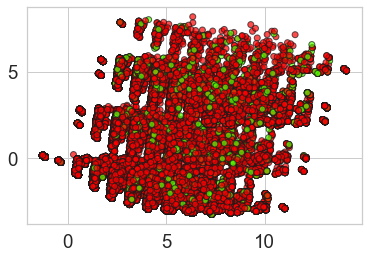

Precision score 0.16512630930375846
Recall score 0.011406682272824004
F1-score score 0.021339278604984472
Accuracy score 0.9375233505905317
Sensibilidade:  0.011406682272824004
Especificação:  0.996337481484685


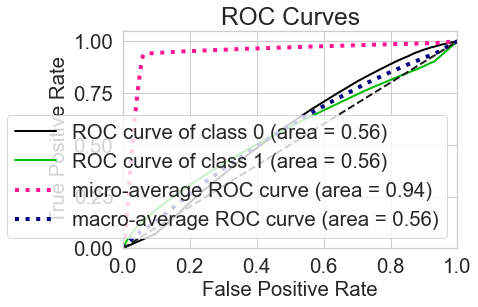

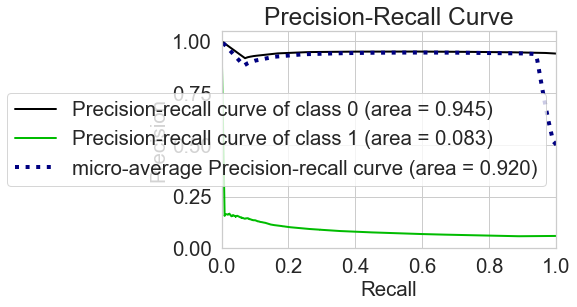

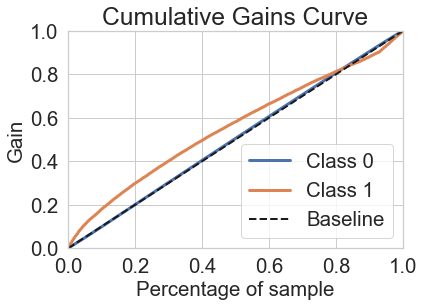

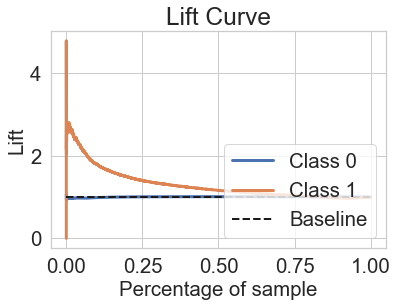

[[368609   1355]
 [ 23227    268]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369964
           1       0.17      0.01      0.02     23495

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [160]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- OverSample

In [161]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750676, 1: 750676})
Testing target statistics: Counter({0: 369964, 1: 23495})


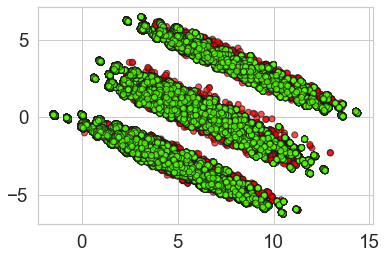

Precision score 0.08301269910886944
Recall score 0.3544583954032773
F1-score score 0.13452110776387732
Accuracy score 0.7276437951603598
Sensibilidade:  0.3544583954032773
Especificação:  0.7513433739498978


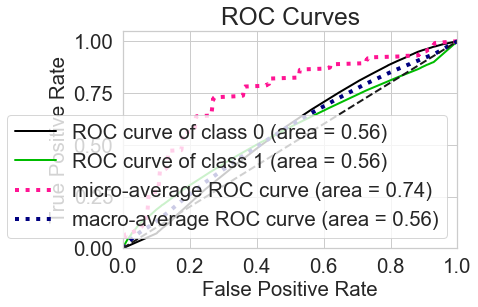

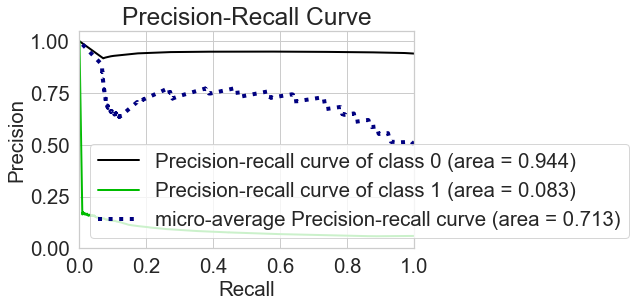

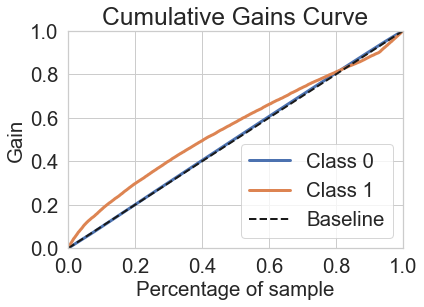

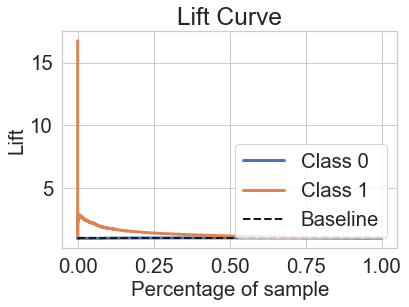

[[277970  91994]
 [ 15167   8328]]
              precision    recall  f1-score   support

           0       0.95      0.75      0.84    369964
           1       0.08      0.35      0.13     23495

    accuracy                           0.73    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.73      0.80    393459



In [162]:
roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

- Smote

In [163]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750676, 1: 750676})
Testing target statistics: Counter({0: 369964, 1: 23495})


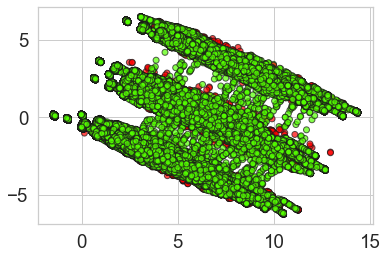

Precision score 0.08146815953678624
Recall score 0.3161949350925729
F1-score score 0.12955599734923792
Accuracy score 0.7462861441725821
Sensibilidade:  0.3161949350925729
Especificação:  0.7735995934739597


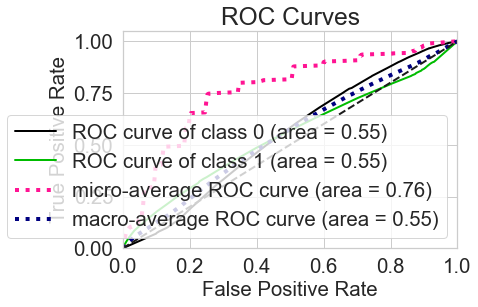

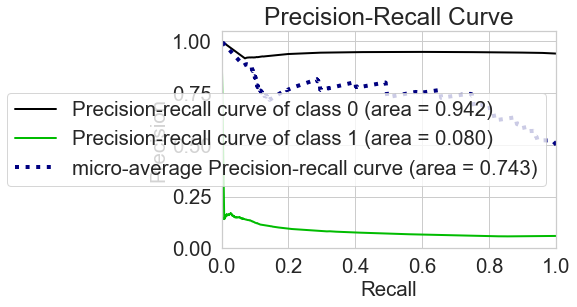

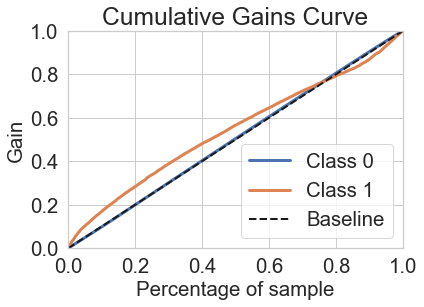

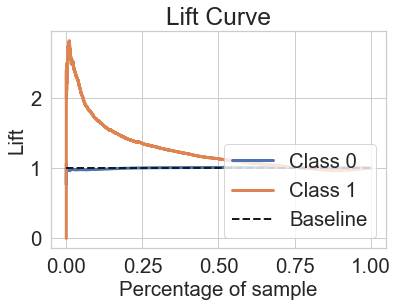

[[286204  83760]
 [ 16066   7429]]
              precision    recall  f1-score   support

           0       0.95      0.77      0.85    369964
           1       0.08      0.32      0.13     23495

    accuracy                           0.75    393459
   macro avg       0.51      0.54      0.49    393459
weighted avg       0.90      0.75      0.81    393459



In [164]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- Undersample

In [165]:
from imblearn.under_sampling import RandomUnderSampler

under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48162, 1: 48162})
Testing target statistics: Counter({0: 369964, 1: 23495})


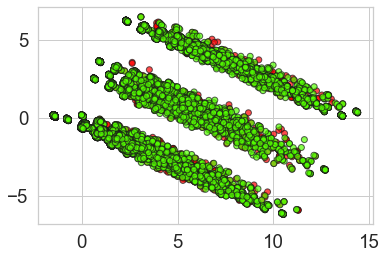

Precision score 0.08348970681117102
Recall score 0.3882102575015961
F1-score score 0.1374244775579696
Accuracy score 0.7089912799046406
Sensibilidade:  0.3882102575015961
Especificação:  0.7293628569266198


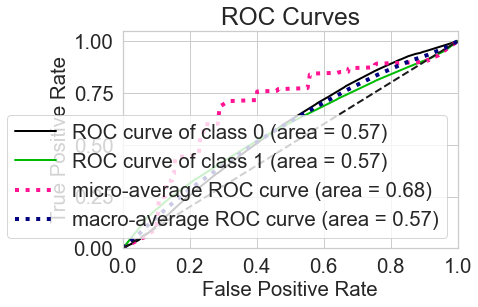

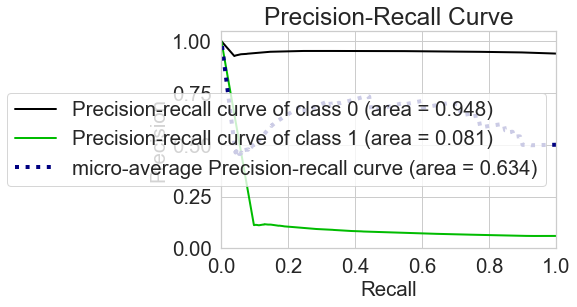

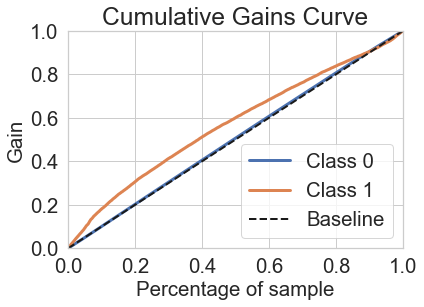

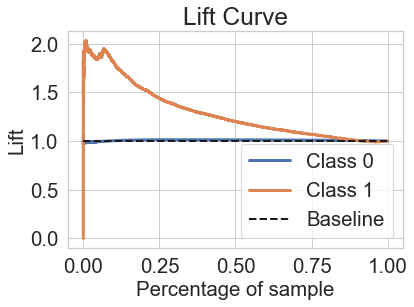

[[269838 100126]
 [ 14374   9121]]
              precision    recall  f1-score   support

           0       0.95      0.73      0.82    369964
           1       0.08      0.39      0.14     23495

    accuracy                           0.71    393459
   macro avg       0.52      0.56      0.48    393459
weighted avg       0.90      0.71      0.78    393459



In [166]:
roc_auc_rus3,fpr_rus3,tpr_rus3 , _ = build_and_test(X_res, X_test, y_res, y_test)

- Near Miss Under Sampler

In [167]:
from imblearn.under_sampling import NearMiss

under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48162, 1: 48162})
Testing target statistics: Counter({0: 369964, 1: 23495})


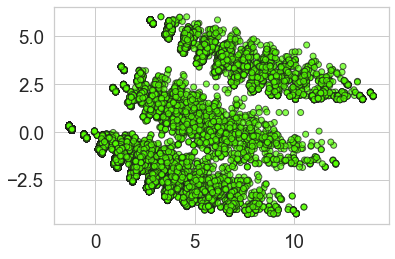

Precision score 0.06342143710984194
Recall score 0.5284103000638434
F1-score score 0.11325023147197934
Accuracy score 0.5058722763998282
Sensibilidade:  0.5284103000638434
Especificação:  0.5044409726351753


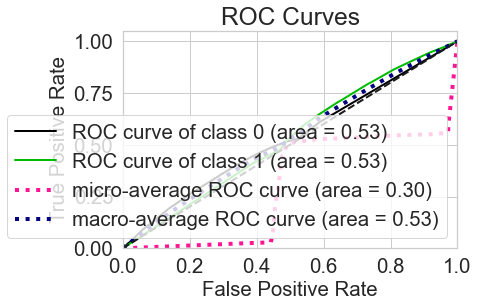

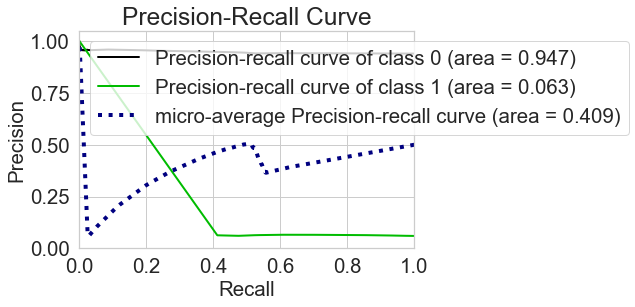

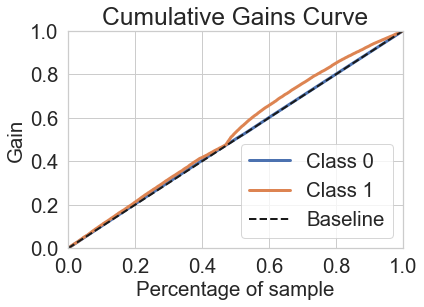

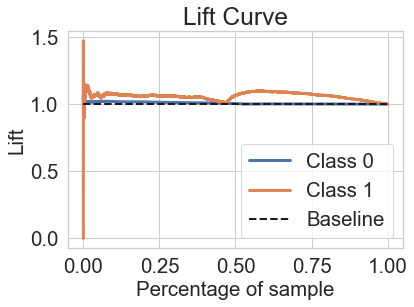

[[186625 183339]
 [ 11080  12415]]
              precision    recall  f1-score   support

           0       0.94      0.50      0.66    369964
           1       0.06      0.53      0.11     23495

    accuracy                           0.51    393459
   macro avg       0.50      0.52      0.39    393459
weighted avg       0.89      0.51      0.63    393459



In [168]:
roc_auc_nm,fpr_nm,tpr_nm, _  = build_and_test(X_res, X_test, y_res, y_test)

- Class Weight

In [169]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750676, 1: 48162}))

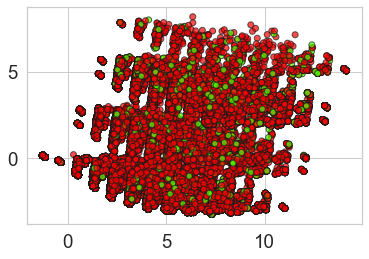

Precision score 0.0878180700676091
Recall score 0.3040646946158757
F1-score score 0.13627736181982927
Accuracy score 0.7698438719154982
Sensibilidade:  0.3040646946158757
Especificação:  0.7994237277140479


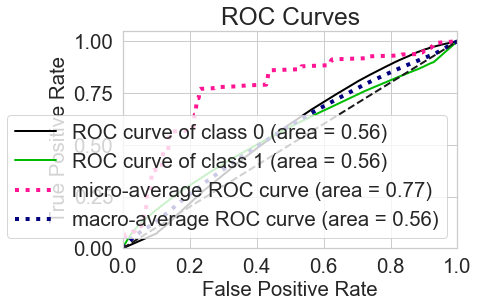

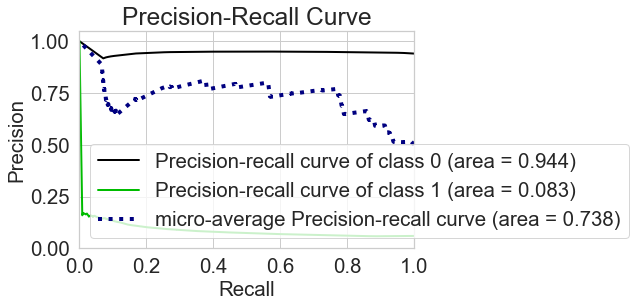

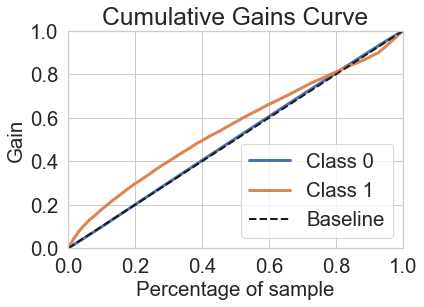

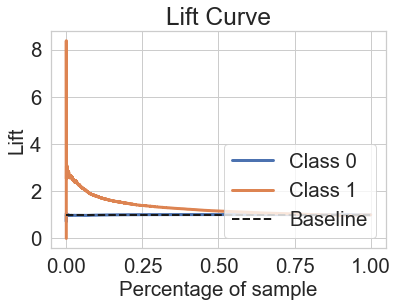

[[295758  74206]
 [ 16351   7144]]
              precision    recall  f1-score   support

           0       0.95      0.80      0.87    369964
           1       0.09      0.30      0.14     23495

    accuracy                           0.77    393459
   macro avg       0.52      0.55      0.50    393459
weighted avg       0.90      0.77      0.82    393459



In [170]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

- Threshold

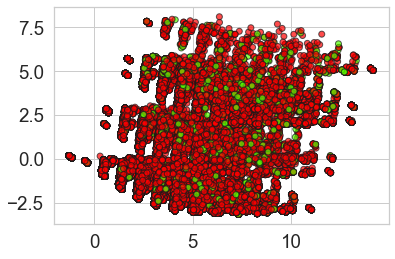

Precision score 0.16676923076923078
Recall score 0.011534369014683975
F1-score score 0.02157643312101911
Accuracy score 0.9375335168340284
Sensibilidade:  0.011534369014683975
Especificação:  0.996340184450379


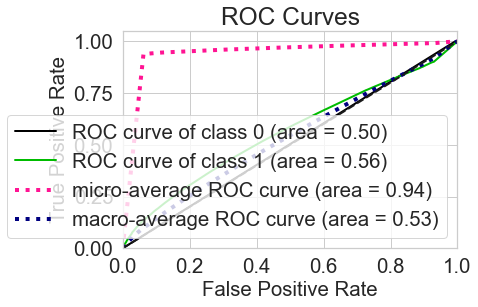

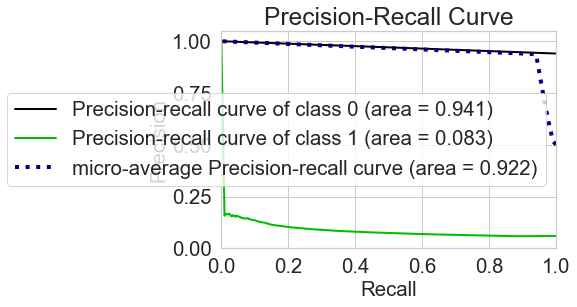

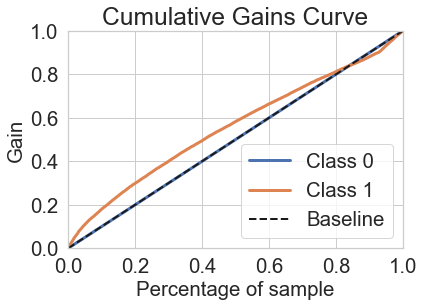

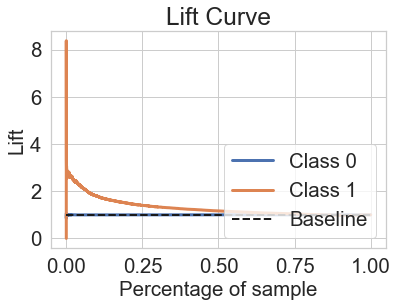

[[368610   1354]
 [ 23224    271]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369964
           1       0.17      0.01      0.02     23495

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

Best Treshold: 0.05925925925925926


In [171]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

- Plot

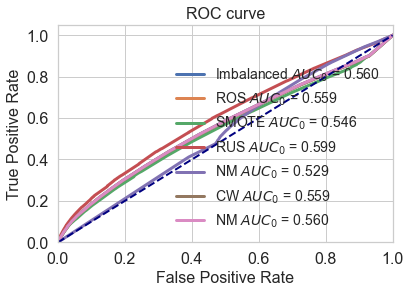

In [172]:
plt.plot(fpr_imb, tpr_imb, lw=3, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros, tpr_ros, lw=3, label='ROS $AUC_0$ = %.3f' % (roc_auc_ros))
plt.plot(fpr_smote, tpr_smote, lw=3, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus, tpr_rus, lw=3, label='RUS $AUC_0$ = %.3f' % (roc_auc_rus))
plt.plot(fpr_nm, tpr_nm, lw=3, label='NM $AUC_0$ = %.3f' % (roc_auc_nm))
plt.plot(fpr_cw, tpr_cw, lw=3, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=3, label='NM $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# RANDOM FOREST US Ajustes 🔱

In [173]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [174]:
import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy'),
    if warm_start:
        model = RandomForestClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    features1 =  model.feature_importances_

    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    feats = {}
    for feature, importance in zip(df1.columns, features1):
        feats[feature] = importance
        importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
        importances = importances.sort_values(by='Gini-Importance', ascending=False)
        importances = importances.reset_index()
        importances = importances.rename(columns={'index': 'Features'})
        sns.set(font_scale = 5)
        sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
        fig, ax = plt.subplots()
        fig.set_size_inches(30,15)
        sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
        plt.xlabel('Importance', fontsize=25, weight = 'bold')
        plt.ylabel('Features', fontsize=25, weight = 'bold')
        plt.title('Feature Importance', fontsize=25, weight = 'bold')
        display(plt.show())
        display(importances)
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [175]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47941, 1: 47941})
Testing target statistics: Counter({0: 369743, 1: 23716})


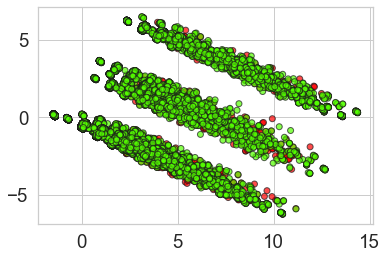

Resultado da prescisão 0.08607548838540176
Resultado do recall 0.41857817507168155
Resultado F1 0.14278830594411882
Resultado acurácia 0.6970688178437906
Sensibilidade:  0.41857817507168155
Especificação:  0.7149317228453277


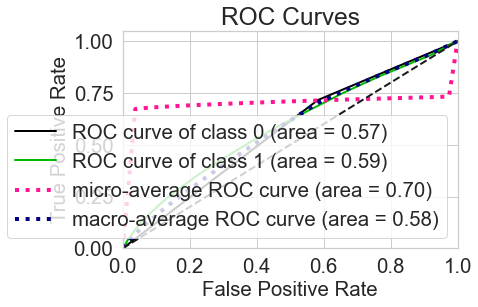

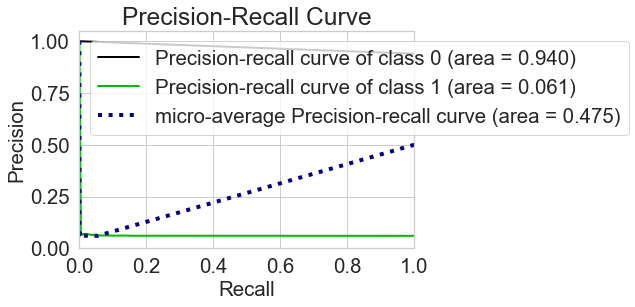

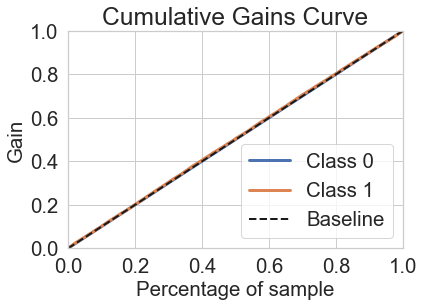

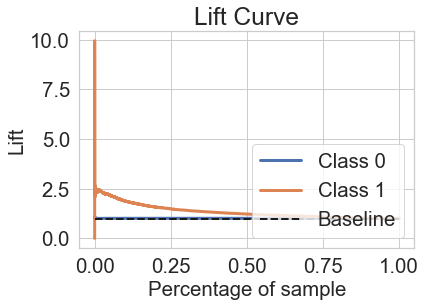

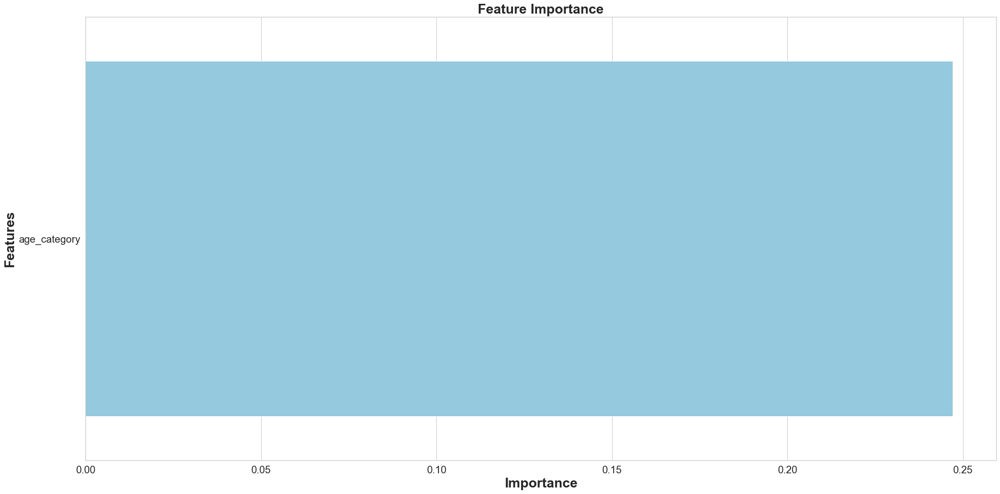

None

,Features,Gini-Importance
0,age_category,0.247181


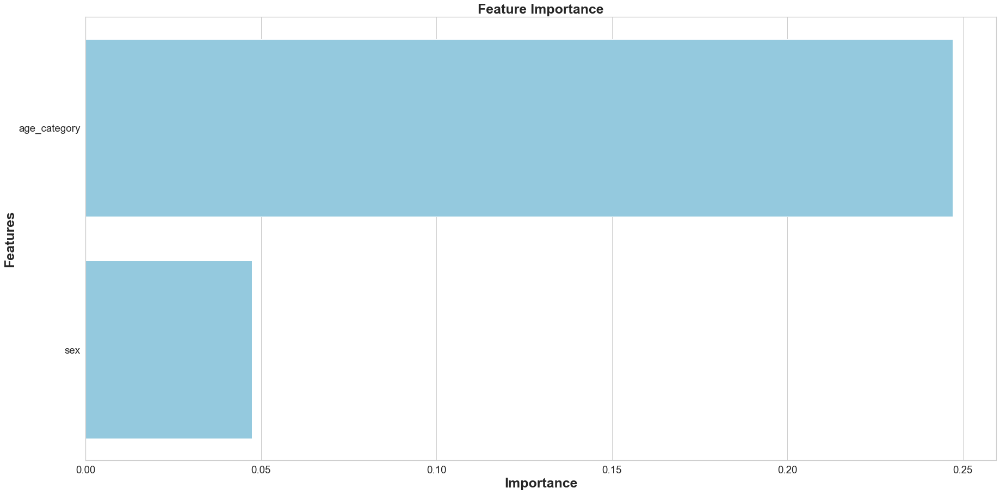

None

,Features,Gini-Importance
0,age_category,0.247181
1,sex,0.047455


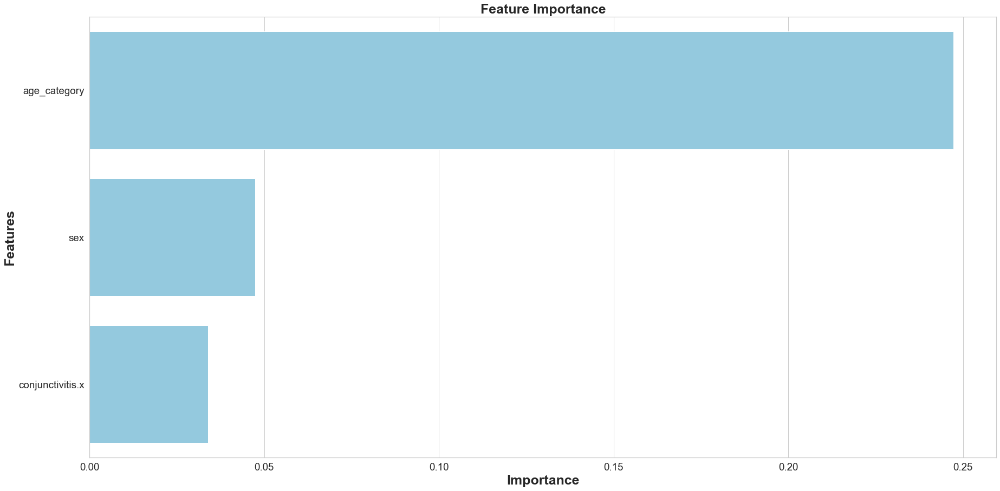

None

,Features,Gini-Importance
0,age_category,0.247181
1,sex,0.047455
2,conjunctivitis.x,0.033845


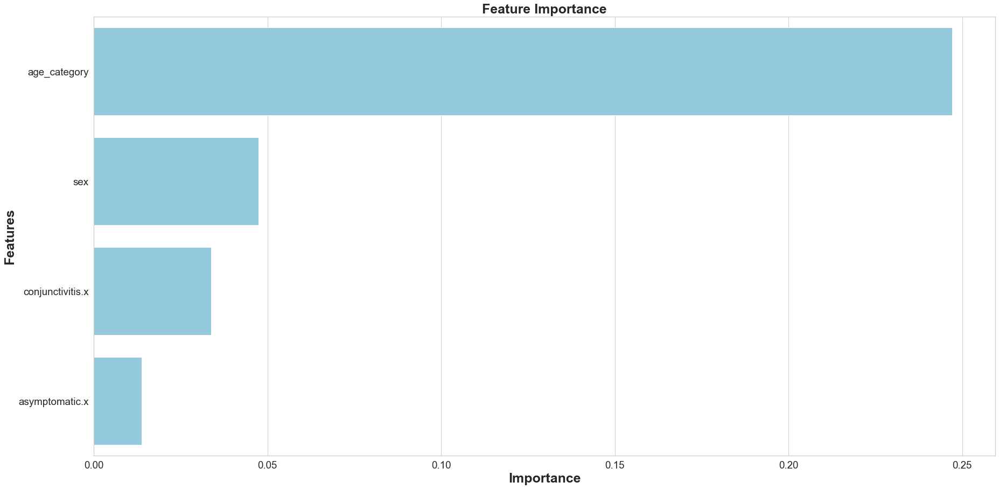

None

,Features,Gini-Importance
0,age_category,0.247181
1,sex,0.047455
2,conjunctivitis.x,0.033845
3,asymptomatic.x,0.013834


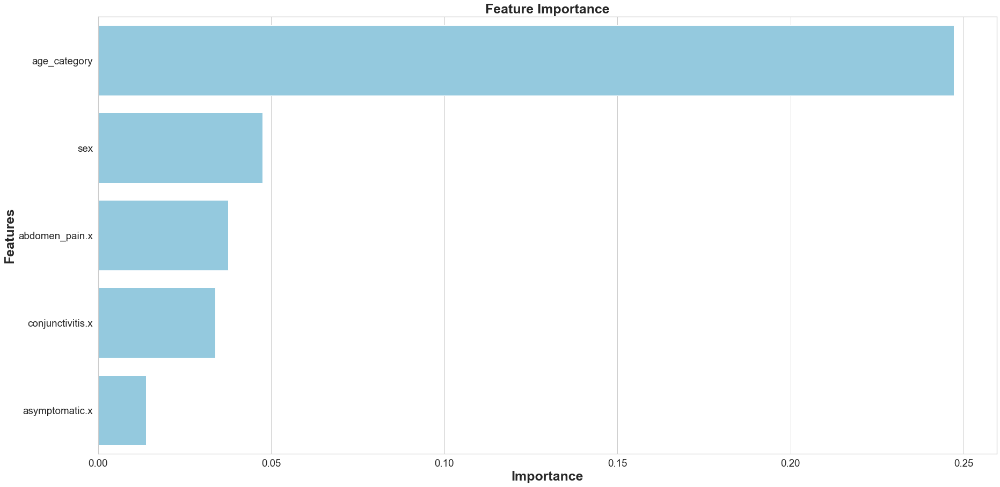

None

,Features,Gini-Importance
0,age_category,0.247181
1,sex,0.047455
2,abdomen_pain.x,0.037574
3,conjunctivitis.x,0.033845
4,asymptomatic.x,0.013834


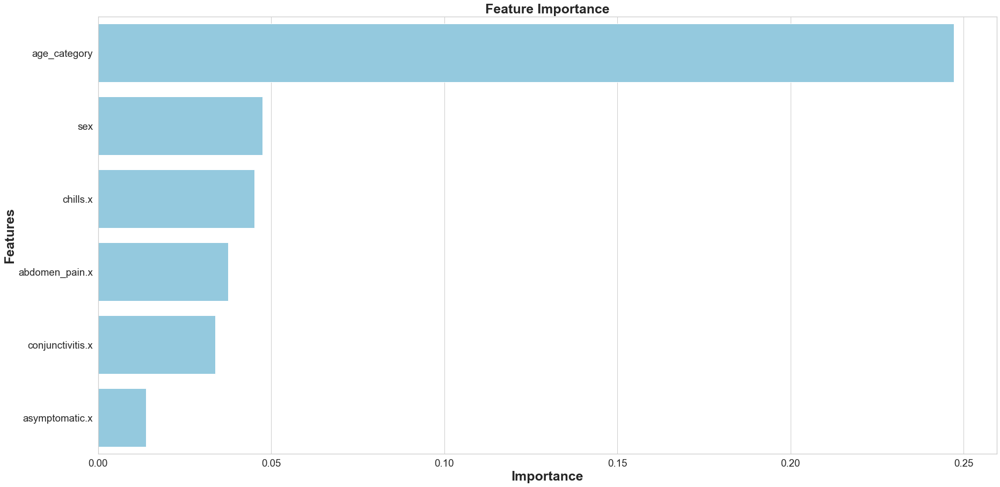

None

,Features,Gini-Importance
0,age_category,0.247181
1,sex,0.047455
2,chills.x,0.045167
3,abdomen_pain.x,0.037574
4,conjunctivitis.x,0.033845
5,asymptomatic.x,0.013834


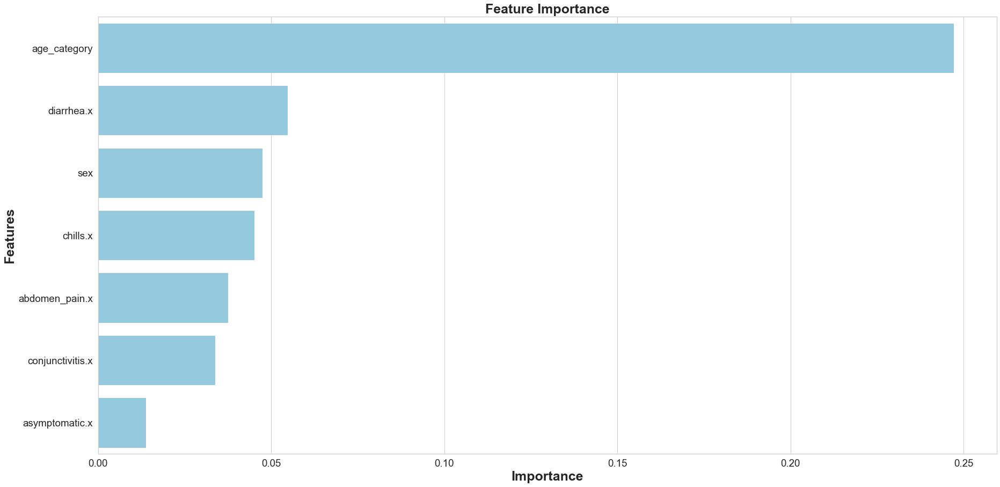

None

,Features,Gini-Importance
0,age_category,0.247181
1,diarrhea.x,0.054748
2,sex,0.047455
3,chills.x,0.045167
4,abdomen_pain.x,0.037574
5,conjunctivitis.x,0.033845
6,asymptomatic.x,0.013834


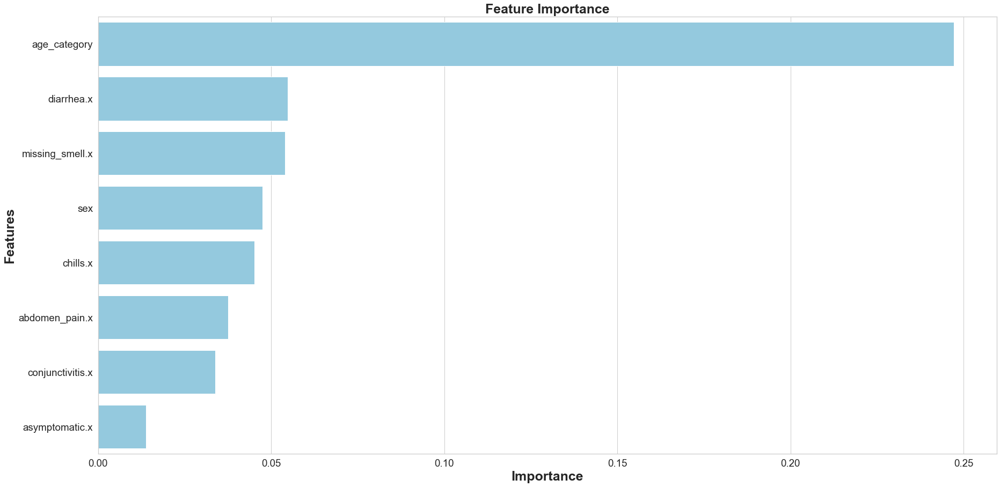

None

,Features,Gini-Importance
0,age_category,0.247181
1,diarrhea.x,0.054748
2,missing_smell.x,0.054054
3,sex,0.047455
4,chills.x,0.045167
5,abdomen_pain.x,0.037574
6,conjunctivitis.x,0.033845
7,asymptomatic.x,0.013834


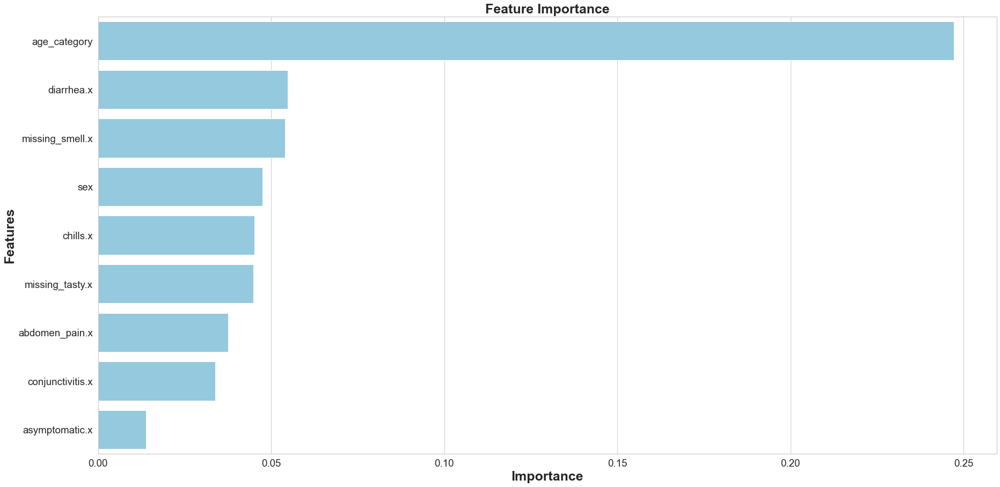

None

,Features,Gini-Importance
0,age_category,0.247181
1,diarrhea.x,0.054748
2,missing_smell.x,0.054054
3,sex,0.047455
4,chills.x,0.045167
5,missing_tasty.x,0.044863
6,abdomen_pain.x,0.037574
7,conjunctivitis.x,0.033845
8,asymptomatic.x,0.013834


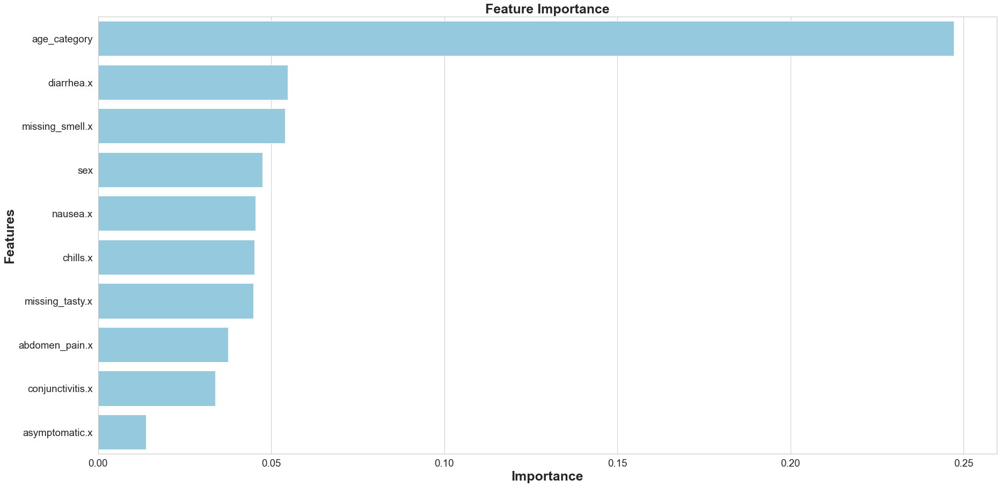

None

,Features,Gini-Importance
0,age_category,0.247181
1,diarrhea.x,0.054748
2,missing_smell.x,0.054054
3,sex,0.047455
4,nausea.x,0.045453
5,chills.x,0.045167
6,missing_tasty.x,0.044863
7,abdomen_pain.x,0.037574
8,conjunctivitis.x,0.033845
9,asymptomatic.x,0.013834


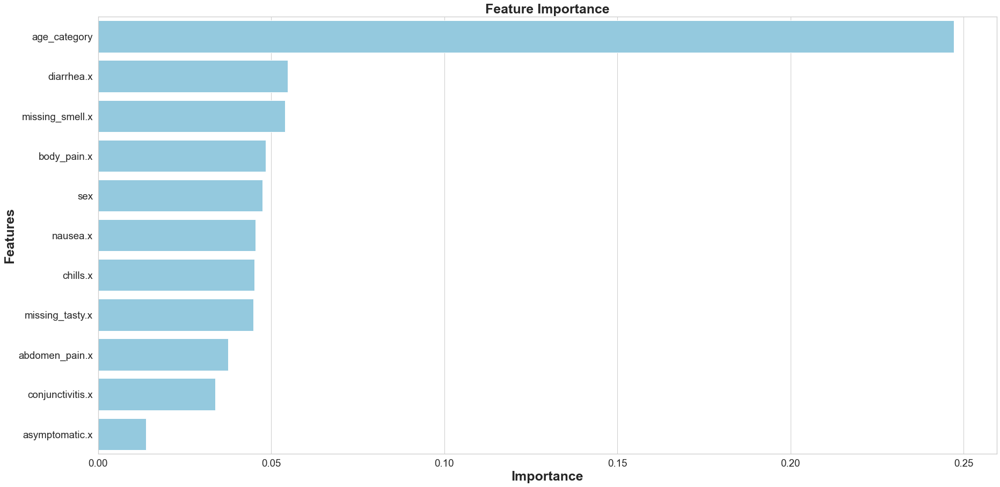

None

,Features,Gini-Importance
0,age_category,0.247181
1,diarrhea.x,0.054748
2,missing_smell.x,0.054054
3,body_pain.x,0.048416
4,sex,0.047455
5,nausea.x,0.045453
6,chills.x,0.045167
7,missing_tasty.x,0.044863
8,abdomen_pain.x,0.037574
9,conjunctivitis.x,0.033845


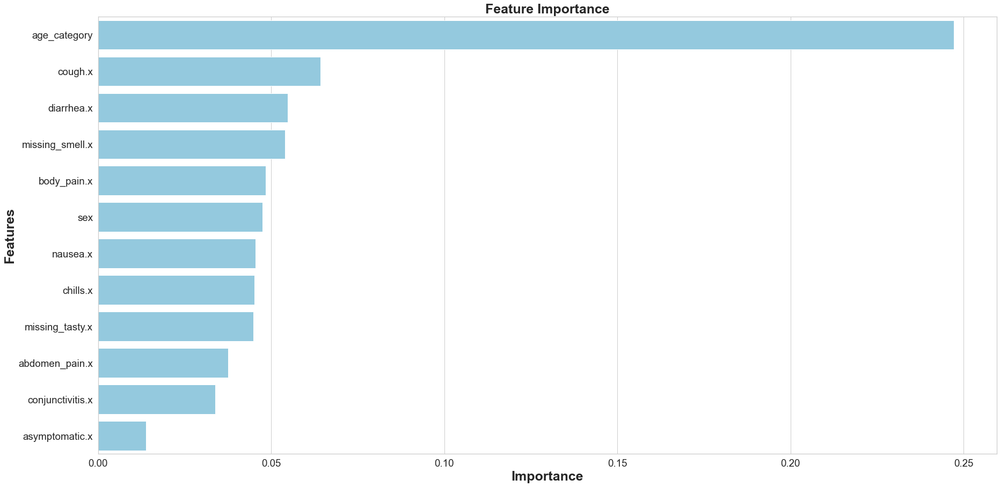

None

,Features,Gini-Importance
0,age_category,0.247181
1,cough.x,0.064260
2,diarrhea.x,0.054748
3,missing_smell.x,0.054054
4,body_pain.x,0.048416
5,sex,0.047455
6,nausea.x,0.045453
7,chills.x,0.045167
8,missing_tasty.x,0.044863
9,abdomen_pain.x,0.037574


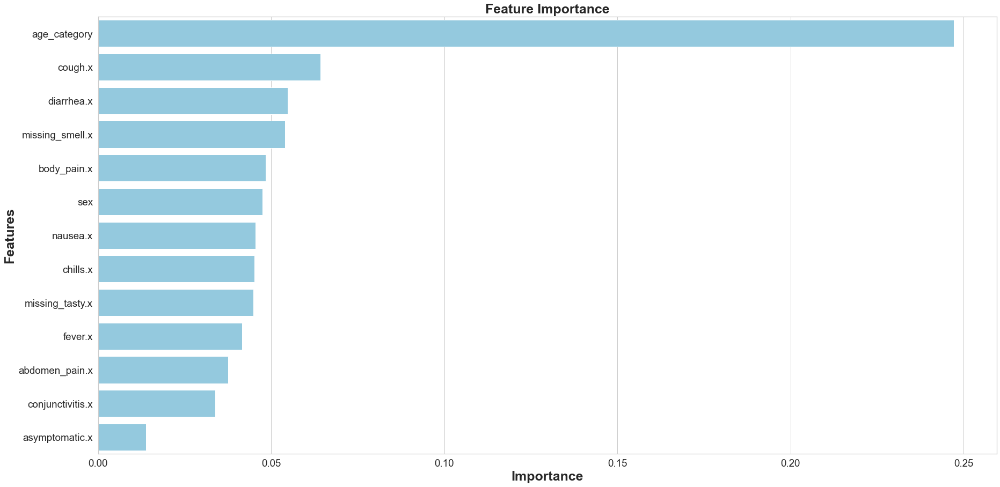

None

,Features,Gini-Importance
0,age_category,0.247181
1,cough.x,0.064260
2,diarrhea.x,0.054748
3,missing_smell.x,0.054054
4,body_pain.x,0.048416
5,sex,0.047455
6,nausea.x,0.045453
7,chills.x,0.045167
8,missing_tasty.x,0.044863
9,fever.x,0.041552


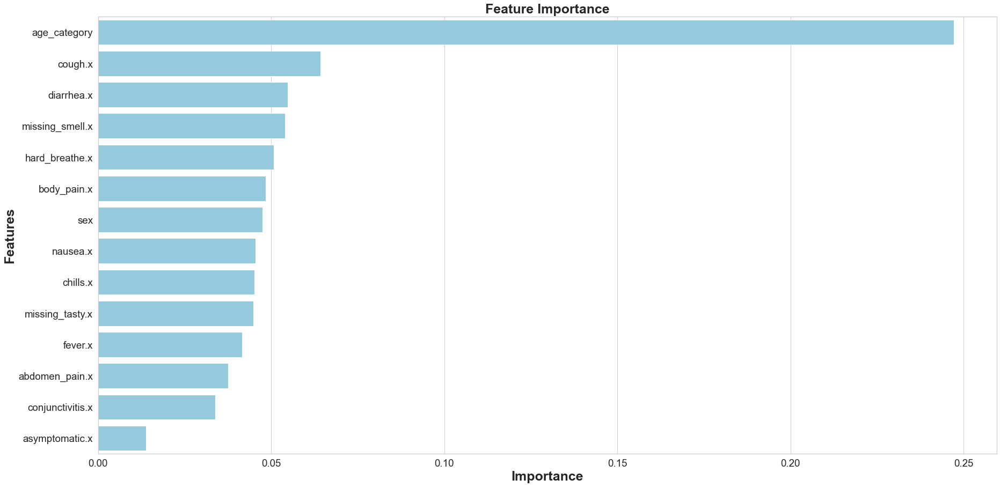

None

,Features,Gini-Importance
0,age_category,0.247181
1,cough.x,0.064260
2,diarrhea.x,0.054748
3,missing_smell.x,0.054054
4,hard_breathe.x,0.050832
5,body_pain.x,0.048416
6,sex,0.047455
7,nausea.x,0.045453
8,chills.x,0.045167
9,missing_tasty.x,0.044863


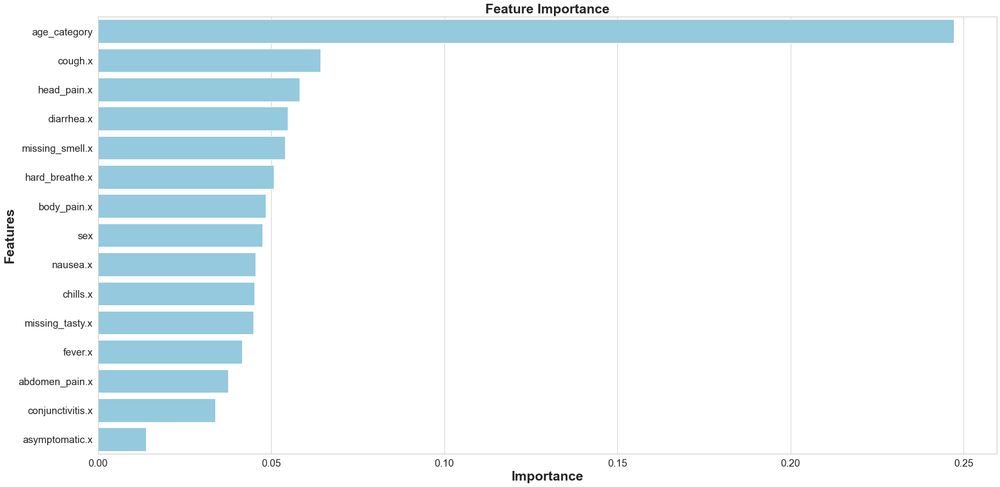

None

,Features,Gini-Importance
0,age_category,0.247181
1,cough.x,0.064260
2,head_pain.x,0.058200
3,diarrhea.x,0.054748
4,missing_smell.x,0.054054
5,hard_breathe.x,0.050832
6,body_pain.x,0.048416
7,sex,0.047455
8,nausea.x,0.045453
9,chills.x,0.045167


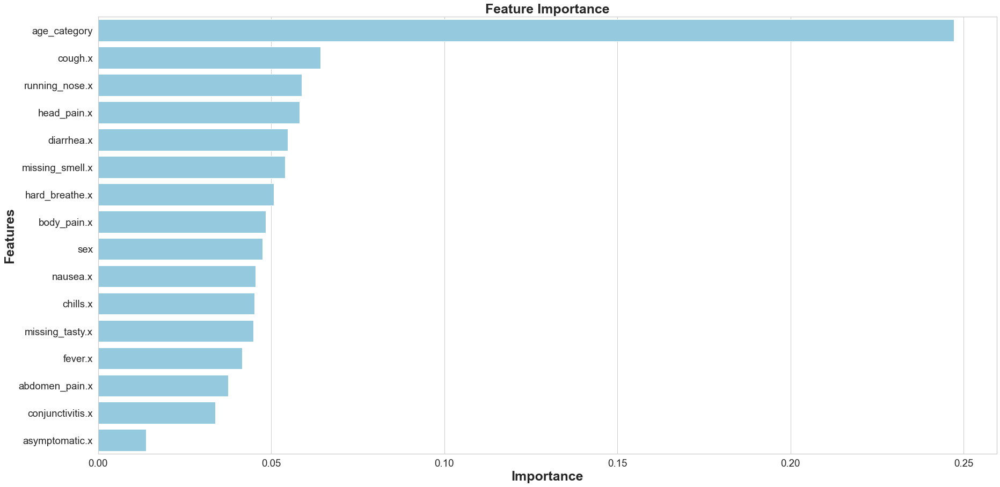

None

,Features,Gini-Importance
0,age_category,0.247181
1,cough.x,0.064260
2,running_nose.x,0.058795
3,head_pain.x,0.058200
4,diarrhea.x,0.054748
5,missing_smell.x,0.054054
6,hard_breathe.x,0.050832
7,body_pain.x,0.048416
8,sex,0.047455
9,nausea.x,0.045453


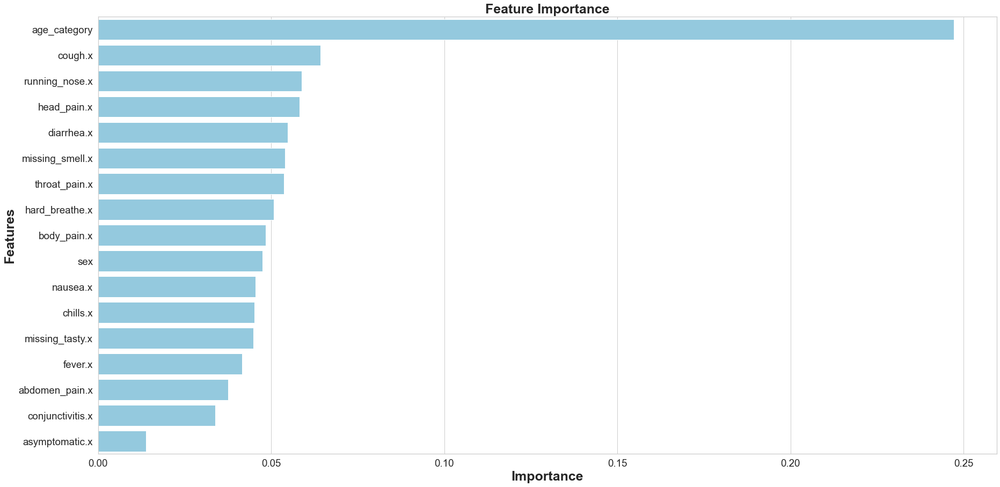

None

,Features,Gini-Importance
0,age_category,0.247181
1,cough.x,0.064260
2,running_nose.x,0.058795
3,head_pain.x,0.058200
4,diarrhea.x,0.054748
5,missing_smell.x,0.054054
6,throat_pain.x,0.053771
7,hard_breathe.x,0.050832
8,body_pain.x,0.048416
9,sex,0.047455


              precision    recall  f1-score   support

           0       0.95      0.71      0.82    369743
           1       0.09      0.42      0.14     23716

    accuracy                           0.70    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.70      0.78    393459

[[264341 105402]
 [ 13789   9927]]


In [176]:
roc_auc_rus1,fpr_rus1,tpr_rus1 , _ = build_and_test(X_res, X_test, y_res, y_test, class_weight = {0:1, 1:ratio}, threshold = True )

# LGT OVERSAMPLER Ajustes 🔱

In [191]:
from sklearn.linear_model import LogisticRegression

In [192]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.feature_selection import RFE
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight =None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = LogisticRegression(class_weight = class_weight)
    if warm_start:
        model = LogisticRegression(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = LogisticRegression()
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
 
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    sensi = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    speci= cm1[1,1]/(cm1[0,1]+cm1[1,1])
    print(cm1[0,0])
    print(cm1[0,1])
    print(cm1[1,0])
    print(cm1[1,1])

    sensi = cm1[1,1]/(cm1[1,1]+cm1[1,0])
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)

    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])

    # importance
    importance = model.coef_[0]
    # summarize
    for i,v in enumerate(importance):
	    print('Feature: %0d, Score: %.5f' % (i,v))

        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show() 
       
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [193]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [194]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750902, 1: 750902})
Testing target statistics: Counter({0: 369738, 1: 23721})


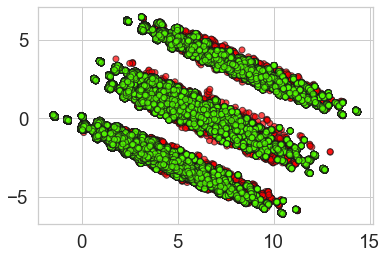

Resultado da prescisão 0.08607486319334262
Resultado do recall 0.4482526031786181
Resultado F1 0.14441811032712407
Resultado acurácia 0.6797963701427595
256839
112899
13088
10633
Sensibilidade:  0.4482526031786181
Especificação:  0.694651347711082
Feature: 0, Score: 0.21749
Feature: 1, Score: -0.08363
Feature: 2, Score: -0.06242
Feature: 3, Score: -0.10107
Feature: 4, Score: -0.00185
Feature: 5, Score: 0.03384
Feature: 6, Score: 0.00250
Feature: 7, Score: 0.11844
Feature: 8, Score: 0.09800
Feature: 9, Score: 0.00765
Feature: 10, Score: 0.03649
Feature: 11, Score: 0.00046
Feature: 12, Score: 0.07037
Feature: 13, Score: 0.02721
Feature: 14, Score: -0.03816
Feature: 15, Score: -0.04319
Feature: 16, Score: -0.06633


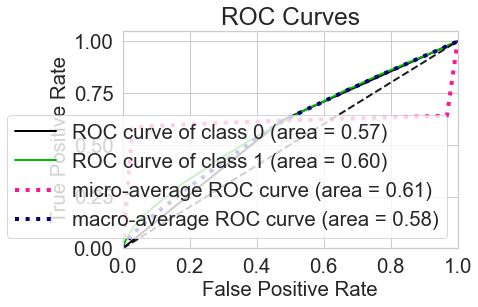

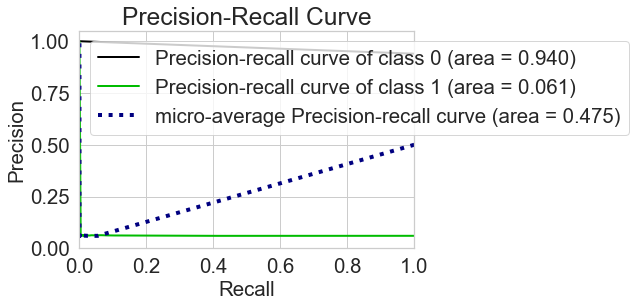

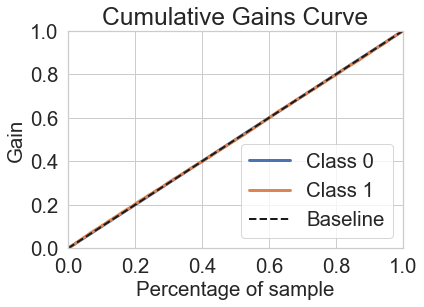

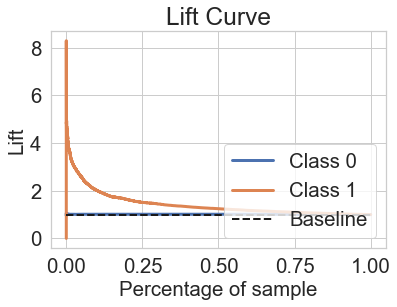

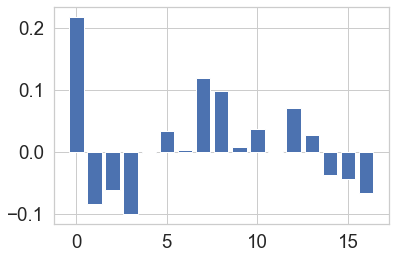

              precision    recall  f1-score   support

           0       0.95      0.69      0.80    369738
           1       0.09      0.45      0.14     23721

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.47    393459
weighted avg       0.90      0.68      0.76    393459

[[256839 112899]
 [ 13088  10633]]


In [195]:
roc_auc_ros2,fpr_ros2,tpr_ros2, _ = build_and_test(X_res, X_test, y_res, y_test, class_weight = {0:1, 1:ratio}, threshold = True)

In [196]:
df1.columns

Index(['age_category', 'sex', 'conjunctivitis.x', 'asymptomatic.x',
       'abdomen_pain.x', 'chills.x', 'diarrhea.x', 'missing_smell.x',
       'missing_tasty.x', 'nausea.x', 'body_pain.x', 'cough.x', 'fever.x',
       'hard_breathe.x', 'head_pain.x', 'running_nose.x', 'throat_pain.x'],
      dtype='object')

# DECISION TREE UNDERSAMPLER Ajustes 🔱

In [183]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report

from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start=False):
    
    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # construindo modelo
    if class_weight:
        model = DecisionTreeClassifier(class_weight = class_weight)
    if warm_start:
        model = DecisionTreeClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = DecisionTreeClassifier()
    model.fit(X_tr, y_tr)
    
    # modelo
    y_pred = model.predict(X_te)
    print('Precision score %s' % precision_score(y_te, y_pred))
    print('Recall score %s' % recall_score(y_te, y_pred))
    print('F1-score score %s' % f1_score(y_te, y_pred))
    print('Accuracy score %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # o melhor threshold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valores que maximizam a estatística J
        best_threshold = thresholds[ix]
        # ajuste de score de acordo com threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
    
    #importance
    importance = model.feature_importances_
    # summarize feature importance
    for i,v in enumerate(importance):
        print('Feature: %0d, Score: %.5f' % (i,v))
    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()
        
    
    # Plot
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_te,y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [184]:
from imblearn.under_sampling import RandomUnderSampler

under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48116, 1: 48116})
Testing target statistics: Counter({0: 369918, 1: 23541})


In [185]:
ratio

15

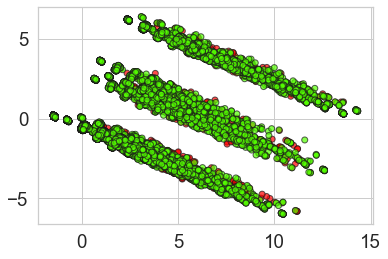

Precision score 0.08279926206359893
Recall score 0.40227687863727113
F1-score score 0.13733196049712137
Accuracy score 0.697620336553491
Sensibilidade:  0.40227687863727113
Especificação:  0.7164155299282544
Feature: 0, Score: 0.17220
Feature: 1, Score: 0.04031
Feature: 2, Score: 0.03507
Feature: 3, Score: 0.02079
Feature: 4, Score: 0.04418
Feature: 5, Score: 0.05019
Feature: 6, Score: 0.07016
Feature: 7, Score: 0.10747
Feature: 8, Score: 0.03832
Feature: 9, Score: 0.05512
Feature: 10, Score: 0.05827
Feature: 11, Score: 0.06495
Feature: 12, Score: 0.02186
Feature: 13, Score: 0.05577
Feature: 14, Score: 0.05903
Feature: 15, Score: 0.06236
Feature: 16, Score: 0.04396


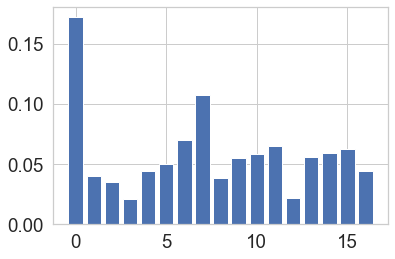

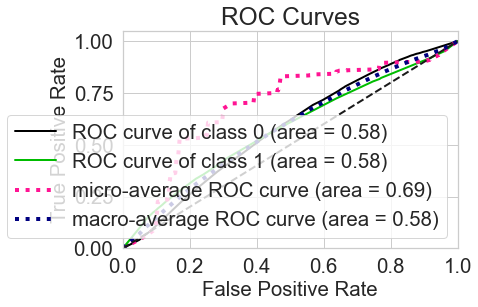

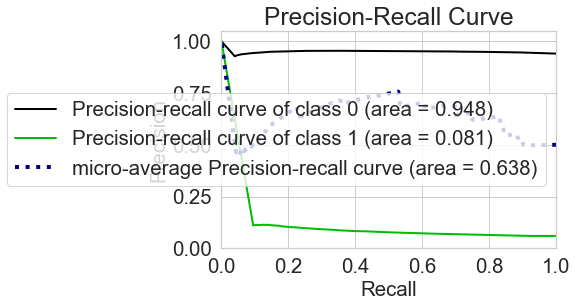

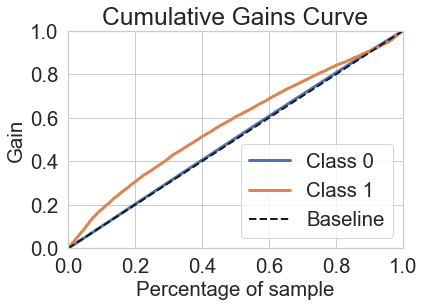

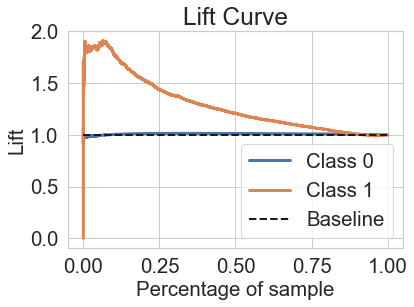

[[265015 104903]
 [ 14071   9470]]
              precision    recall  f1-score   support

           0       0.95      0.72      0.82    369918
           1       0.08      0.40      0.14     23541

    accuracy                           0.70    393459
   macro avg       0.52      0.56      0.48    393459
weighted avg       0.90      0.70      0.78    393459



In [186]:
roc_auc_rus3,fpr_rus3,tpr_rus3 , _ = build_and_test(X_res, X_test, y_res, y_test)

# RANDOM FOREST NEAR MISS Ajustes 🔱

In [197]:
import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy'),
    if warm_start:
        model = RandomForestClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    features1 =  model.feature_importances_

    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    feats = {}
    for feature, importance in zip(df1.columns, features1):
        feats[feature] = importance
        importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
        importances = importances.sort_values(by='Gini-Importance', ascending=False)
        importances = importances.reset_index()
        importances = importances.rename(columns={'index': 'Features'})
        sns.set(font_scale = 5)
        sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
        fig, ax = plt.subplots()
        fig.set_size_inches(30,15)
        sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
        plt.xlabel('Importance', fontsize=25, weight = 'bold')
        plt.ylabel('Features', fontsize=25, weight = 'bold')
        plt.title('Feature Importance', fontsize=25, weight = 'bold')
        display(plt.show())
        display(importances)
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [198]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47936, 1: 47936})
Testing target statistics: Counter({0: 369738, 1: 23721})


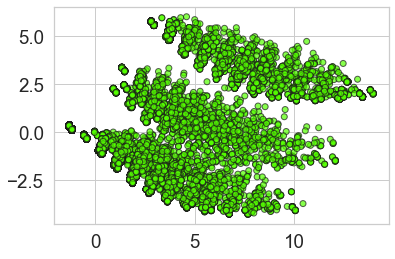

Resultado da prescisão 0.06473664662363605
Resultado do recall 0.5437376164579908
Resultado F1 0.11569840194834026
Resultado acurácia 0.49889823336103634
Sensibilidade:  0.5437376164579908
Especificação:  0.49602150712125886


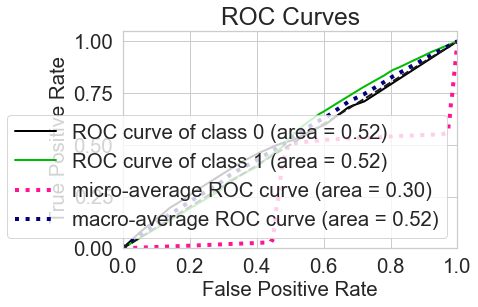

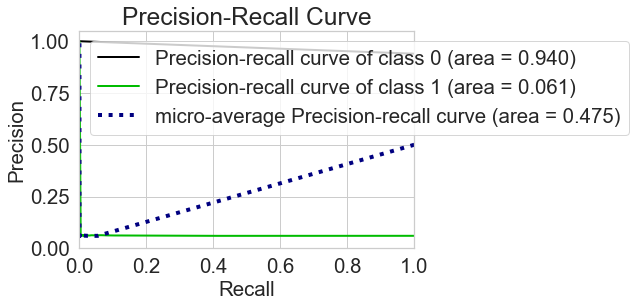

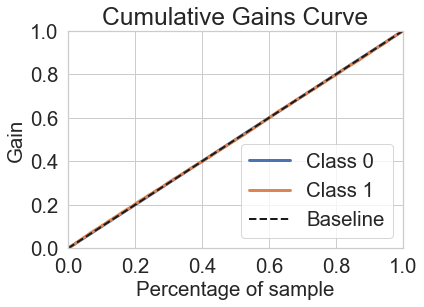

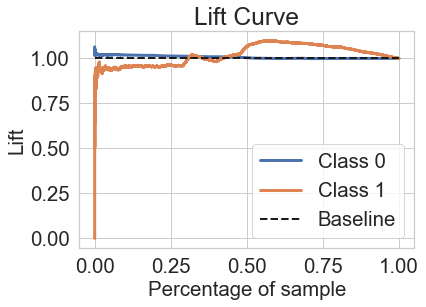

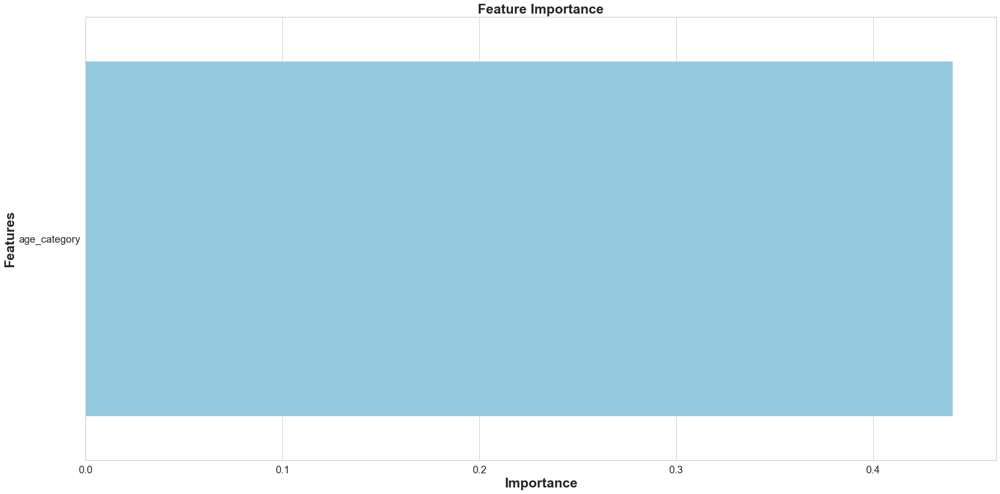

None

,Features,Gini-Importance
0,age_category,0.440616


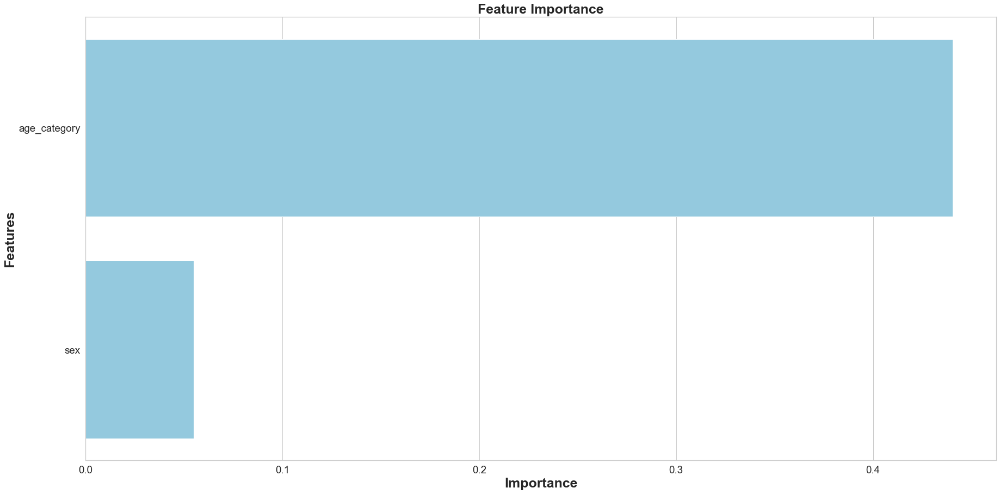

None

,Features,Gini-Importance
0,age_category,0.440616
1,sex,0.054964


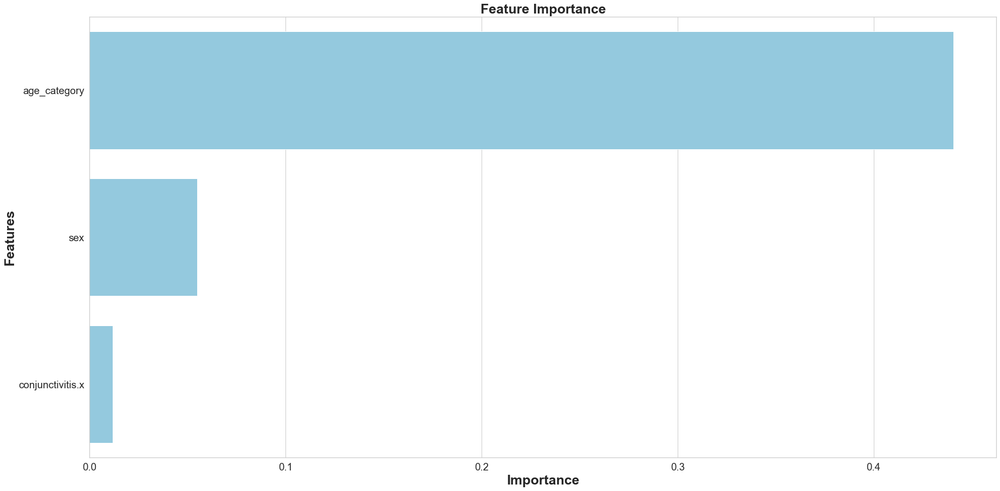

None

,Features,Gini-Importance
0,age_category,0.440616
1,sex,0.054964
2,conjunctivitis.x,0.011869


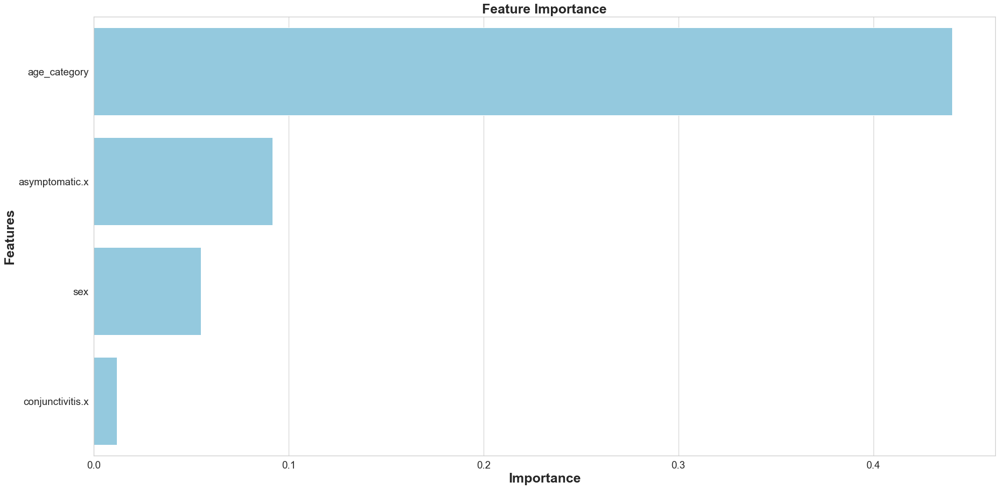

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,conjunctivitis.x,0.011869


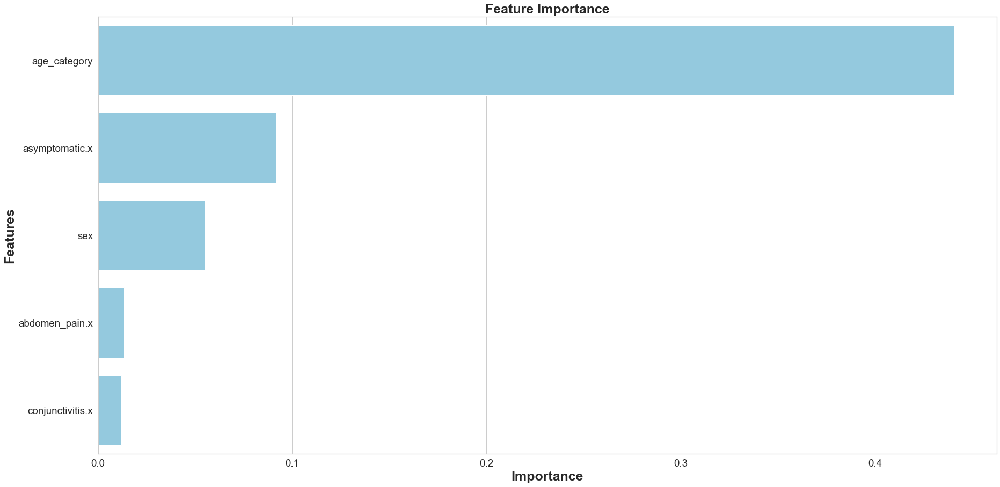

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,abdomen_pain.x,0.013432
4,conjunctivitis.x,0.011869


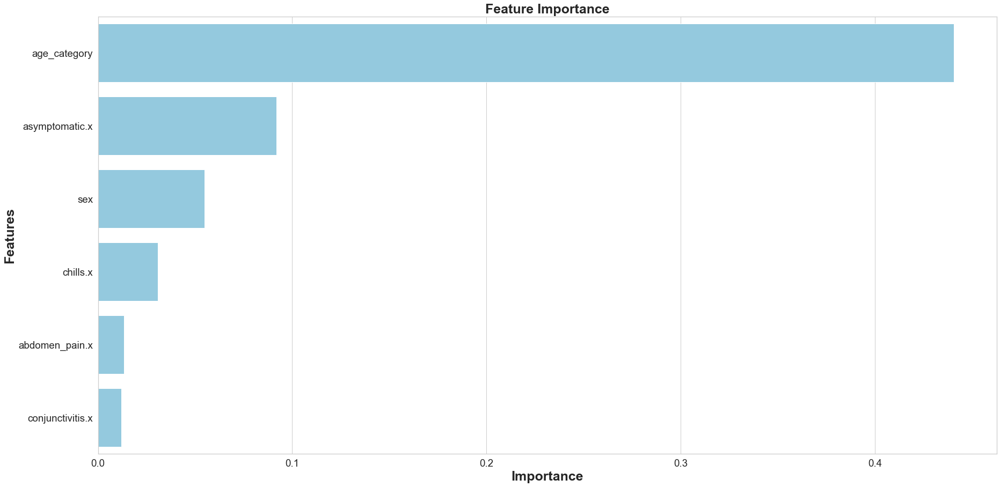

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,chills.x,0.030908
4,abdomen_pain.x,0.013432
5,conjunctivitis.x,0.011869


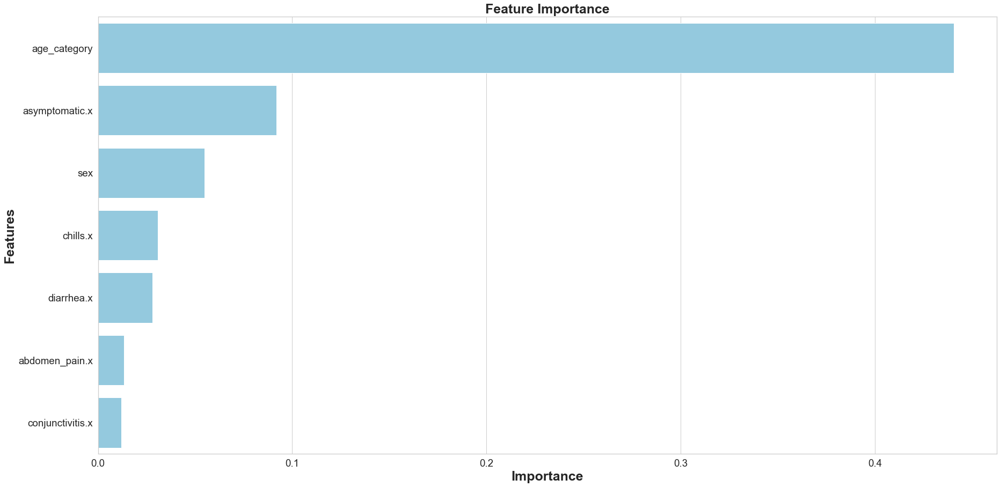

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,chills.x,0.030908
4,diarrhea.x,0.028029
5,abdomen_pain.x,0.013432
6,conjunctivitis.x,0.011869


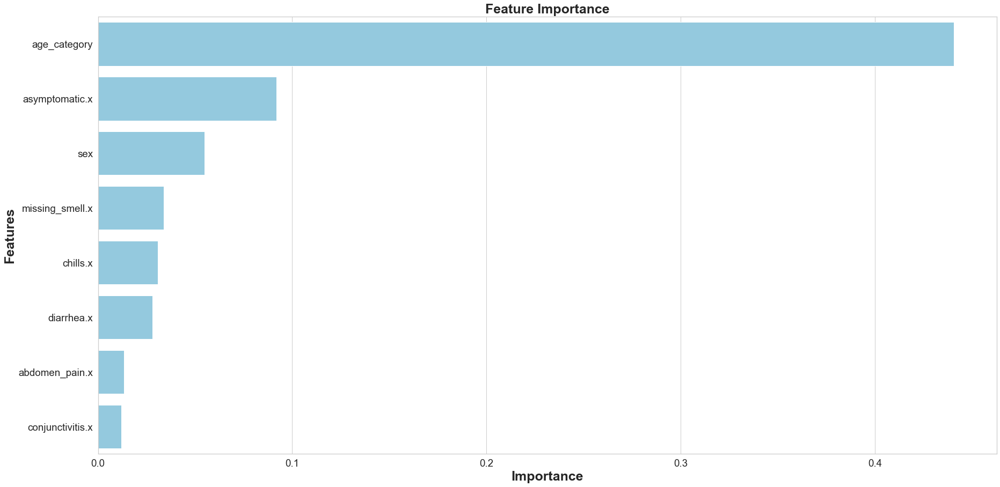

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_smell.x,0.033736
4,chills.x,0.030908
5,diarrhea.x,0.028029
6,abdomen_pain.x,0.013432
7,conjunctivitis.x,0.011869


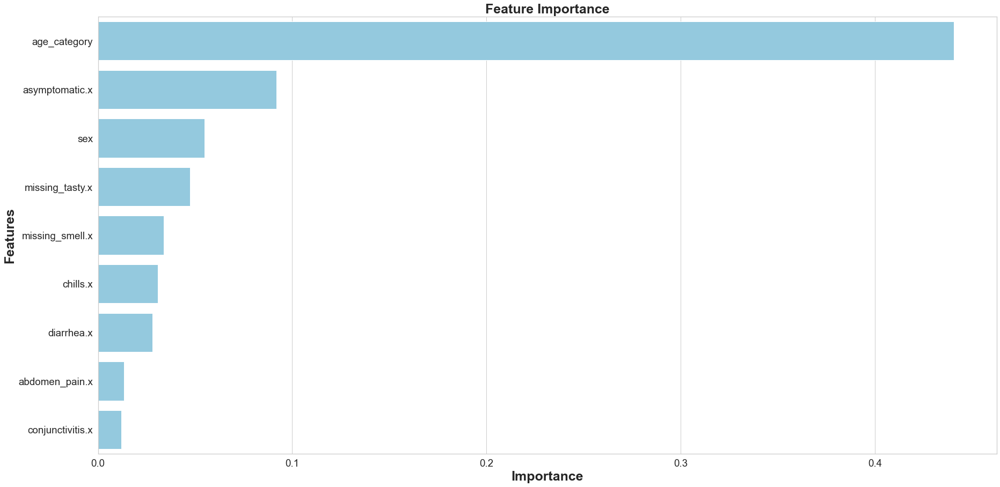

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,missing_smell.x,0.033736
5,chills.x,0.030908
6,diarrhea.x,0.028029
7,abdomen_pain.x,0.013432
8,conjunctivitis.x,0.011869


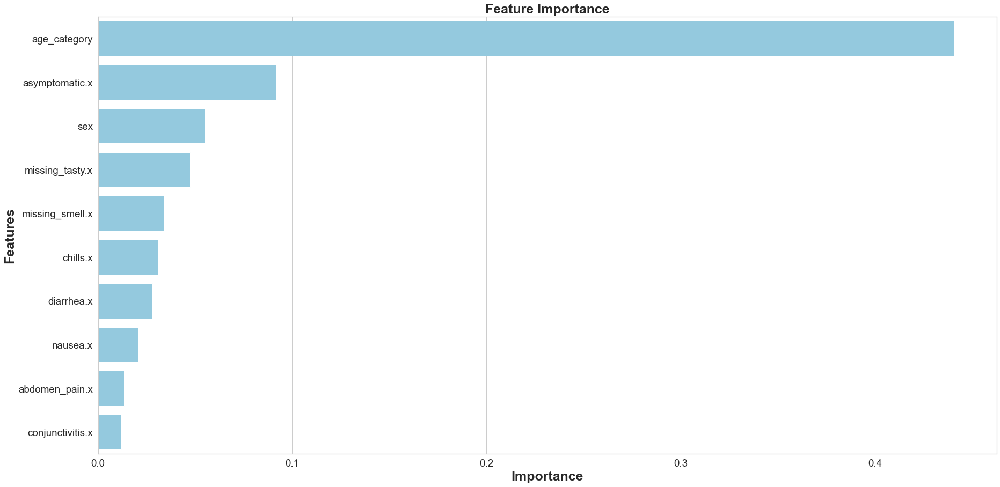

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,missing_smell.x,0.033736
5,chills.x,0.030908
6,diarrhea.x,0.028029
7,nausea.x,0.020511
8,abdomen_pain.x,0.013432
9,conjunctivitis.x,0.011869


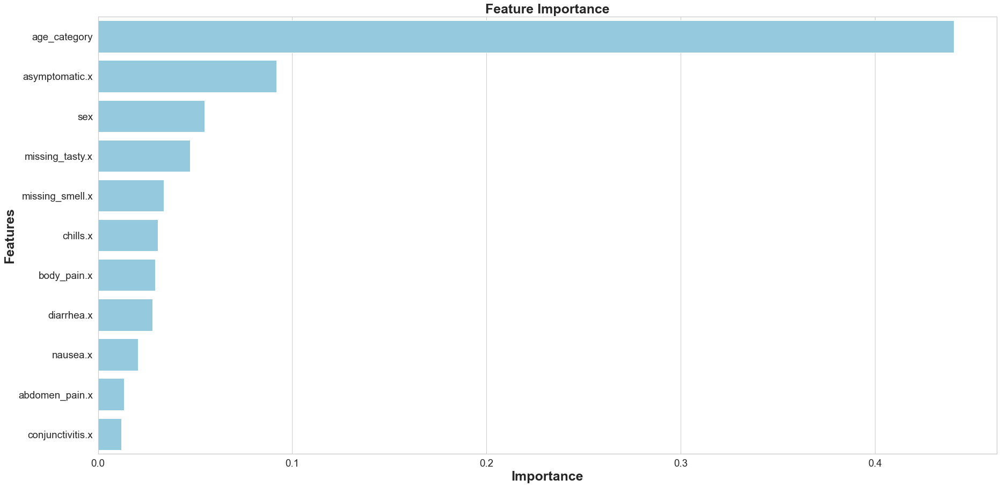

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,missing_smell.x,0.033736
5,chills.x,0.030908
6,body_pain.x,0.029401
7,diarrhea.x,0.028029
8,nausea.x,0.020511
9,abdomen_pain.x,0.013432


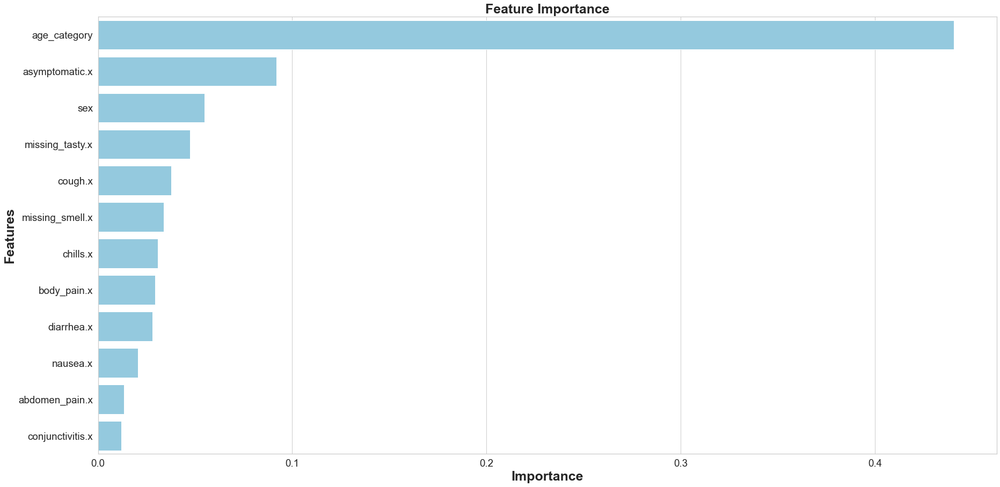

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,cough.x,0.037798
5,missing_smell.x,0.033736
6,chills.x,0.030908
7,body_pain.x,0.029401
8,diarrhea.x,0.028029
9,nausea.x,0.020511


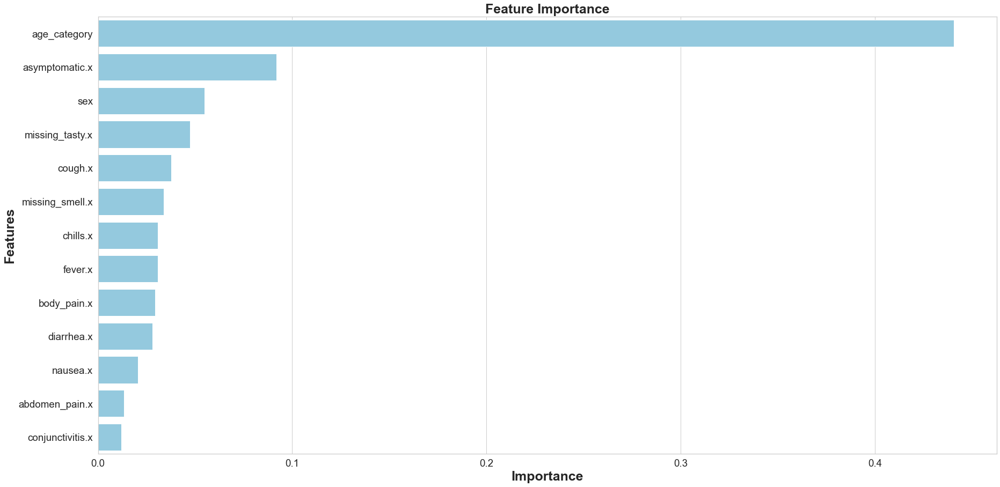

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,cough.x,0.037798
5,missing_smell.x,0.033736
6,chills.x,0.030908
7,fever.x,0.030774
8,body_pain.x,0.029401
9,diarrhea.x,0.028029


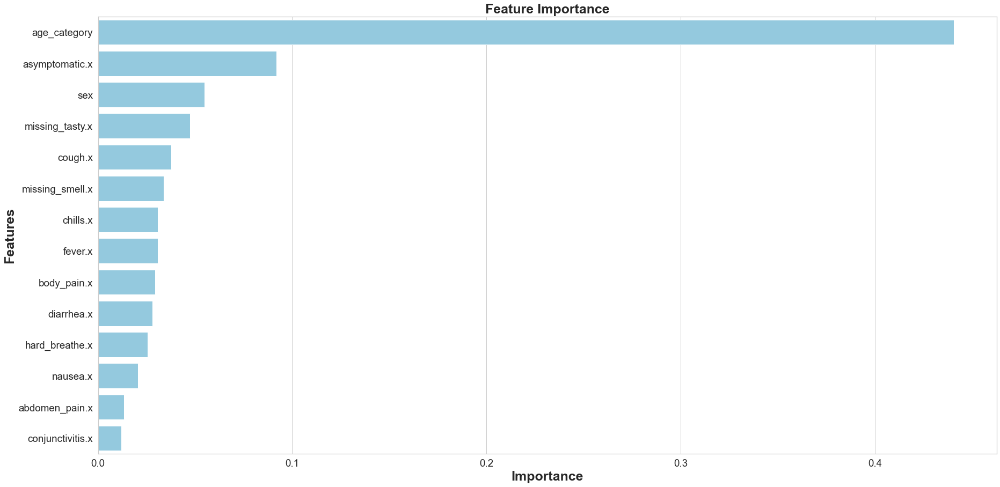

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,cough.x,0.037798
5,missing_smell.x,0.033736
6,chills.x,0.030908
7,fever.x,0.030774
8,body_pain.x,0.029401
9,diarrhea.x,0.028029


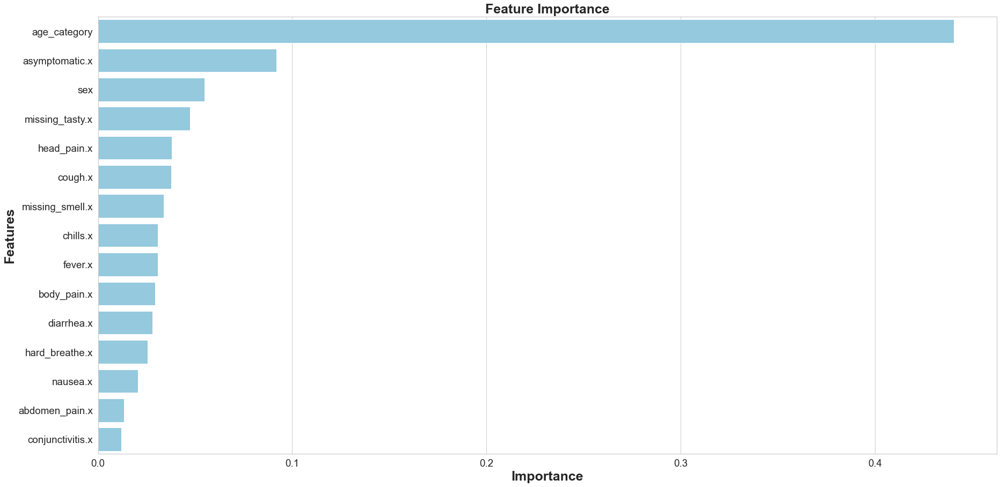

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,head_pain.x,0.037974
5,cough.x,0.037798
6,missing_smell.x,0.033736
7,chills.x,0.030908
8,fever.x,0.030774
9,body_pain.x,0.029401


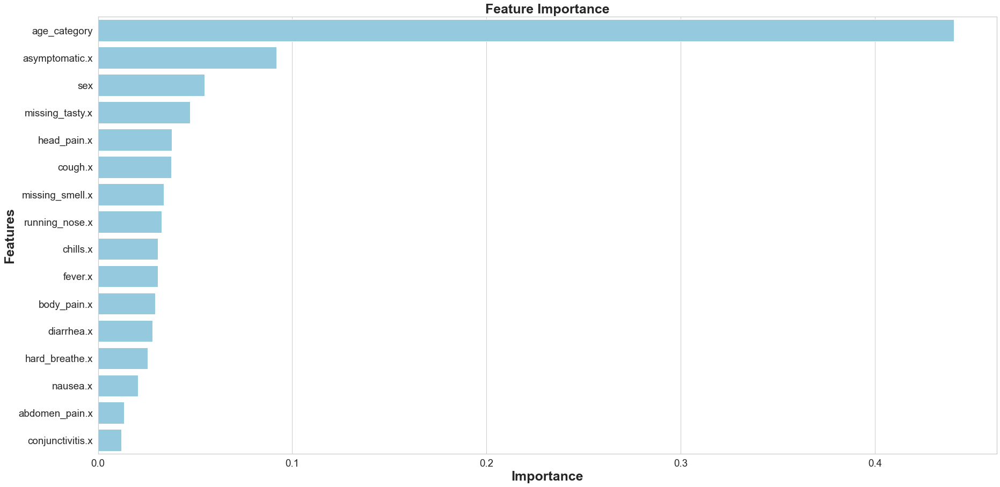

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,head_pain.x,0.037974
5,cough.x,0.037798
6,missing_smell.x,0.033736
7,running_nose.x,0.032806
8,chills.x,0.030908
9,fever.x,0.030774


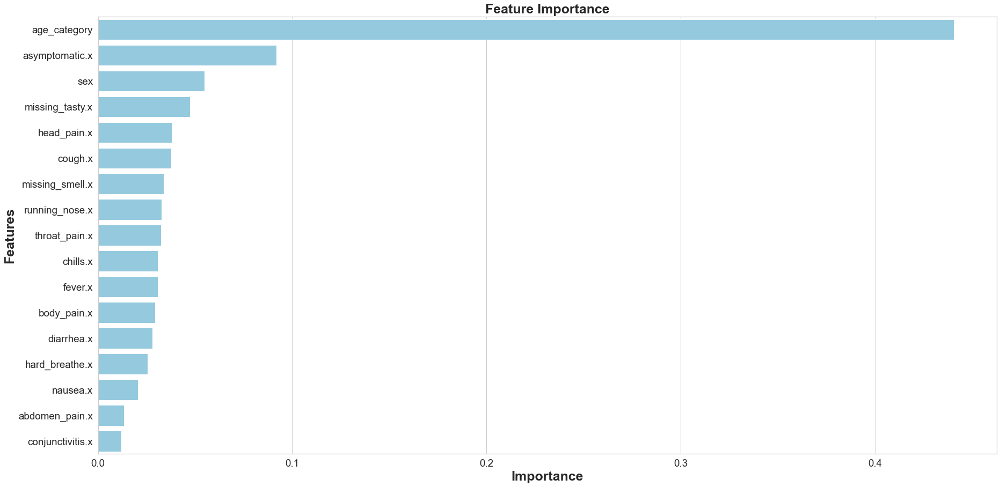

None

,Features,Gini-Importance
0,age_category,0.440616
1,asymptomatic.x,0.091802
2,sex,0.054964
3,missing_tasty.x,0.047301
4,head_pain.x,0.037974
5,cough.x,0.037798
6,missing_smell.x,0.033736
7,running_nose.x,0.032806
8,throat_pain.x,0.032548
9,chills.x,0.030908


              precision    recall  f1-score   support

           0       0.94      0.50      0.65    369738
           1       0.06      0.54      0.12     23721

    accuracy                           0.50    393459
   macro avg       0.50      0.52      0.38    393459
weighted avg       0.89      0.50      0.62    393459

[[183398 186340]
 [ 10823  12898]]


In [199]:
roc_auc_nm1,fpr_nm1,tpr_nm1, _  = build_and_test(X_res, X_test, y_res, y_test)

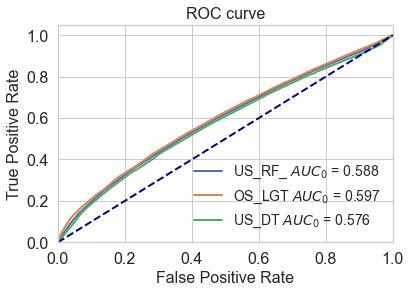

In [200]:
plt.plot(fpr_rus1, tpr_rus1, lw=2, label='US_RF_ $AUC_0$ = %.3f' % (roc_auc_rus1))
plt.plot(fpr_ros2, tpr_ros2, lw=2, label='OS_LGT $AUC_0$ = %.3f' % (roc_auc_ros2))
plt.plot(fpr_rus3, tpr_rus3, lw=2, label='US_DT $AUC_0$ = %.3f' % (roc_auc_rus3))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()